Machine Learning 

Predicting price of unit listed on AirBnB In New York City 

Proposed hypothesis and approach
We hypothesize that we can predict price of unit from the AirBnb dataset. The dataset is from Kaggle: https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data. The target variable is Price


Understanding the dataset given in the problem. The different features avaliable in the problem are: 
Id:Airbnb's unique identifier for the listing
host_Id:Airbnb's unique identifier for the host/user
name:Name of the listing
host_name:Name of the host. Usually just the first name(s)
price:daily price for the listing
minimum_nights:minimum number of night stay for the listing (calendar rules may be different)
number_of_reviews:The number of reviews the listing has
calculated_host_listing_count:The number of listings the host has in the current scrape, in the city/region geography.
avaliability_365:avaliability_x. The availability of the listing x days in the future as determined by the calendar. Note a listing may be available because it has been booked by a guest or blocked by the host.
reviews_per_month:Reviews per month
latitude:Uses the World Geodetic System (WGS84) projection for latitude and longitude.
longititude:Uses the World Geodetic System (WGS84) projection for latitude and longitude.:
neighbourhood_group:The neighbourhood group as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.
neighbour:The neighbourhood as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.
last_review:The date of the last/newest review
room_type:
All homes are grouped into the following three room types:
Entire place
Private room
Shared room
Entire place
Entire places are best if you're seeking a home away from home. With an entire place, you'll have the whole space to yourself. This usually includes a bedroom, a bathroom, a kitchen, and a separate, dedicated entrance. Hosts should note in the description if they'll be on the property or not (ex: ""Host occupies first floor of the home""), and provide further details on the listing.
Private rooms
Private rooms are great for when you prefer a little privacy, and still value a local connection. When you book a private room, you'll have your own private room for sleeping and may share some spaces with others. You might need to walk through indoor spaces that another host or guest may occupy to get to your room.
Shared rooms
Shared rooms are for when you don't mind sharing a space with others. When you book a shared room, you'll be sleeping in a space that is shared with others and share the entire space with other people. Shared rooms are popular among flexible travelers looking for new friends and budget-friendly stays.





1) Data Pre-Processing

In [1]:
# Import Pandas and Numpy 
import pandas as pd
import numpy as np

# Setting for Figures
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Make this notebook's stable across runs
random_state=42

In [233]:
import time
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.metrics import explained_variance_score
from sklearn.decomposition import PCA
from sklearn.ensemble import AdaBoostRegressor,GradientBoostingRegressor,ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor

In [4]:
# Import Dataset 
df = pd.read_csv('NYCListing.csv')

B) Data Inspection and Cleaning
Here we will perform each data cleaning step individually as part of the exploratory analysis.

In [5]:
#Displayng the rows and columns in the dataset
df.shape

(48895, 16)

Shape of the data shows that there are 48,895 instances within the dataset or 48,895 rows in the dataset. There are 16 columns or 16 features in the dataset. 

In [6]:
#Displaying rows and columns in dataset
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


Above the rows and columns are displayed such and id, name, host_id,host_name,neighbourhood group, neighbourhood, latitude, longitude,room type, price,mininum nights, number of reviews, last review, reviews per month, calculated host listings count and avliability 365

In [7]:
#Displaying rows and columns in dataset
df.head(40)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0
7,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220
8,5203,Cozy Clean Guest Room - Family Apt,7490,MaryEllen,Manhattan,Upper West Side,40.80178,-73.96723,Private room,79,2,118,2017-07-21,0.99,1,0
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,2019-06-09,1.33,4,188


In [8]:
#Checking Datatypes
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

Checking the datatypes above: There are 6 objects, 3 floats and 7 integer values. 

In [9]:
#Total Number of Observations, Columns and types of data in a summary form
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

The info method gets the quick description of dataset for example total number of rows,each attribute type and number of non-null values. Isnull detects the number of missing values. 

In [10]:
#Check for missing Values
df.isnull().values.any()

True

In [11]:
#Count number of missing values in each column?
df.isnull().sum().to_frame()

,0
id,0
name,16
host_id,0
host_name,21
neighbourhood_group,0
neighbourhood,0
latitude,0
longitude,0
room_type,0
price,0


In [12]:
# Total number of missing values
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [13]:
#Finding columns with NAN values
df.columns[df.isna().any()].tolist()

['name', 'host_name', 'last_review', 'reviews_per_month']

In [14]:
# Check for duplicates
df.duplicated().any()

False

There are no duplicated in this dataset

In [15]:
#checking missing data and percentage 
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(15)

,Total,Percent
last_review,10052,0.205583
reviews_per_month,10052,0.205583
host_name,21,0.000429
name,16,0.000327
id,0,0.000000
host_id,0,0.000000
neighbourhood_group,0,0.000000
neighbourhood,0,0.000000
latitude,0,0.000000
longitude,0,0.000000


Checking missing data and percent missing in the dataset. Last review, reveiws per month both have about 20% missing data. Host name and name have 21% and 16% missing data. 

In [16]:
#Data Cleaning, replacing NAN values with zero's
df=df.fillna(0)

In [17]:
#Checking for missing values 
df.isna().sum().to_frame()

,0
id,0
name,0
host_id,0
host_name,0
neighbourhood_group,0
neighbourhood,0
latitude,0
longitude,0
room_type,0
price,0


In [18]:
#Changing object of last_review to datetime
df['last_review']=pd.to_datetime(df.last_review)

In [19]:
#Checking datatype for lastreview
df.dtypes

id                                         int64
name                                      object
host_id                                    int64
host_name                                 object
neighbourhood_group                       object
neighbourhood                             object
latitude                                 float64
longitude                                float64
room_type                                 object
price                                      int64
minimum_nights                             int64
number_of_reviews                          int64
last_review                       datetime64[ns]
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
dtype: object

In [20]:
# Find unique values for Target
df.price.unique()

array([  149,   225,   150,    89,    80,   200,    60,    79,   135,
          85,   120,   140,   215,    99,   190,   299,   130,   110,
          44,   180,    50,    52,    55,    70,    35,    40,    68,
         115,   151,   228,   144,    69,    49,   375,   250,   275,
         230,    51,    65,   105,    95,   145,   285,    94,   800,
         131,    98,   100,   125,   175,   500,   101,   220,    59,
         350,   199,   325,   235,   170,   400,    75,    90,   185,
          77,    76,   160,   195,   156,   219,   475,   165,   196,
          83,   123,   265,   249,   121,    45,    71,    64,   159,
         189,   239,   305,   155,    92,    36,    37,   205,    39,
         390,   129,   212,   124,   122,   109,   575,   229,   169,
         113,   179,   349,   139,   650,    67,   599,   211,   290,
          87,   395,   260,    97,   132,   141,   495,   259,    96,
         295,   451,   300,    42,   255,    72,    88,   450,   198,
          46,    33,

In [21]:
# Find unique values for neighbourhood
df.last_review.unique()

array(['2018-10-19T00:00:00.000000000', '2019-05-21T00:00:00.000000000',
       '1970-01-01T00:00:00.000000000', ...,
       '2017-12-23T00:00:00.000000000', '2018-01-29T00:00:00.000000000',
       '2018-03-29T00:00:00.000000000'], dtype='datetime64[ns]')

In [22]:
# Find unique values for neighbourhood
df.name.unique()

array(['Clean & quiet apt home by the park', 'Skylit Midtown Castle',
       'THE VILLAGE OF HARLEM....NEW YORK !', ...,
       'Sunny Studio at Historical Neighborhood',
       '43rd St. Time Square-cozy single bed',
       "Trendy duplex in the very heart of Hell's Kitchen"], dtype=object)

In [23]:
# Find unique values for neighbourhood
df.neighbourhood.unique()

array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

Describe function below shows summary of only numerical attributes and no categorical attributes. Max,Min and Mean show the maximum value, minimum vale and average value with in the column being considered. Std shows the standard deviation within the dataset. Low means spread out around the mean and high value means more widely spread out. The percentiles are  25%,50% and 75%. A percentile indicates the value below which a given percentage of observations in a group of observation fall. For example, 25% of the price means price is lower than 69. while 50% range means lower than 106 and 75% means lower than 175. 

Univarate analysis: Conducting univarate analysis via exploring each variable by itself. For numeric variables have done mean, median,min,max.count is done. Histograms are plotted for all the numeric variables. Univarate Analysis for categorical variables as well. Bar charts will be plotted for categorical variable and boxplots are plotted as well,

In [24]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.090910,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.597283,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.040000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.370000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [25]:
#Using describe function for the price 
# Max price is $10,000: Min price: $0 ; Mean price is $152
df['price'].describe()


count    48895.000000
mean       152.720687
std        240.154170
min          0.000000
25%         69.000000
50%        106.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

Text(0, 0.5, 'Frequency')

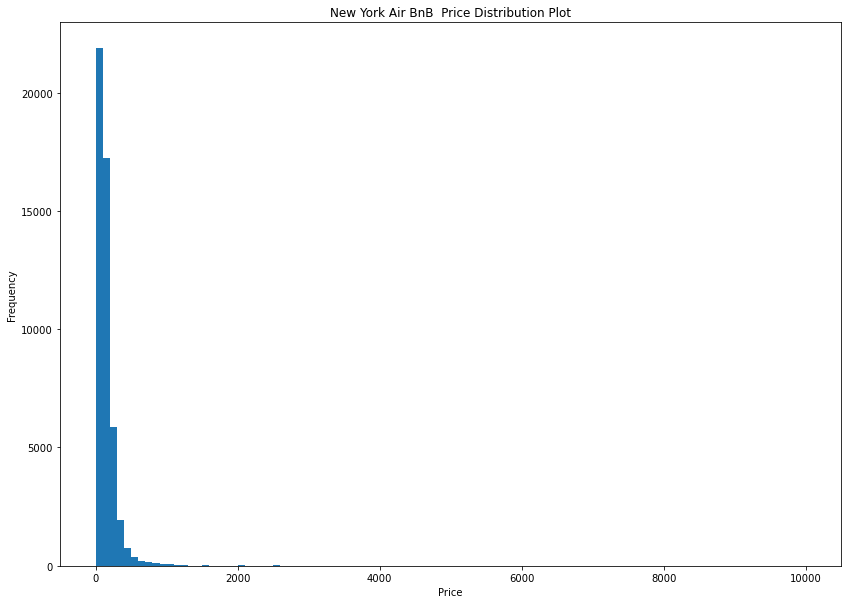

In [26]:
# Univarate Analysis 
#Plotting histogram using matplotlib
plt.figure(figsize=[14,10])
a = df['price']
plt.hist(a, bins = 100)
plt.title("New York Air BnB  Price Distribution Plot")
plt.xlabel("Price")
plt.ylabel("Frequency")
# price is not show a normal distribution.

In [27]:
#Calculating Median
df.median()

<ipython-input-27-c42f745a6f67>:2: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  df.median()


id                                1.967728e+07
host_id                           3.079382e+07
latitude                          4.072307e+01
longitude                        -7.395568e+01
price                             1.060000e+02
minimum_nights                    3.000000e+00
number_of_reviews                 5.000000e+00
reviews_per_month                 3.700000e-01
calculated_host_listings_count    1.000000e+00
availability_365                  4.500000e+01
dtype: float64

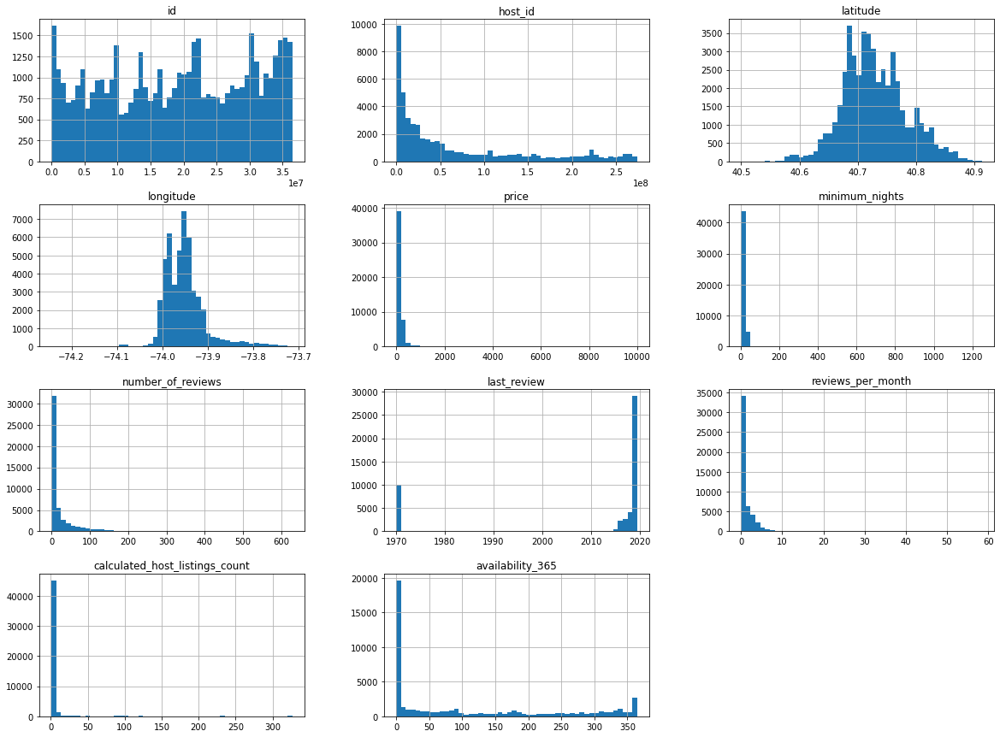

In [28]:
# Plotting histogram for the entire dataset
df.hist(bins=50, figsize=(20,15))
plt.show()

Observations about the histogram:
1. Price, Mininum number of nights, host count listings, number of review,availiability 365,host_id and reviews per month show the histogram to be more tail heavy. They extend more to the right of the median rather than left of the median. This may make machine learning algorithim harder to detect pattern
2. Latitude and Longitude, are bit more centered. 
3. Id is more spread out throughout the dataset but no clear bell shaped curve
4. Avaliablity 365 is also very tail heavy meaning it extends more to the right of median


Univarate Analysis

Conducting Univarate Analysis means exploring each variable by itself using mean,median,min,max,count,plot histogram, plot boxplot to identify outliers. 

C:\Users\ocean\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


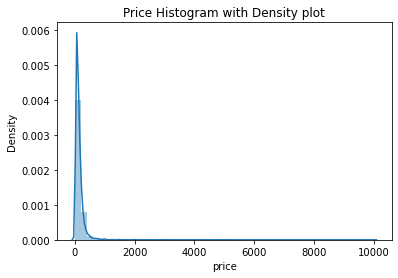

In [29]:
#Univarate analysis 
#Ploting historgram using distplot from seaborn 
hist,ax = plt.subplots()
ax = sns.distplot(df['price'])
ax.set_title('Price Histogram with Density plot')
plt.show()


In [31]:
# Describe function to understand key metrics
df['minimum_nights'].describe()

count    48895.000000
mean         7.029962
std         20.510550
min          1.000000
25%          1.000000
50%          3.000000
75%          5.000000
max       1250.000000
Name: minimum_nights, dtype: float64

In [32]:
#To identify unique values
df.minimum_nights.unique()

array([   1,    3,   10,   45,    2,    5,    4,   90,    7,   14,   60,
         29,   30,  180,    9,   31,    6,   15,    8,   26,   28,  200,
         50,   17,   21,   11,   25,   13,   35,   27,   18,   20,   40,
         44,   65,   55,  120,  365,  122,   19,  240,   88,  115,  150,
        370,   16,   80,  181,  265,  300,   59,  185,  360,   56,   12,
         70,   39,   24,   32, 1000,  110,  270,   22,   75,  250,   62,
         23, 1250,  364,   74,  198,  100,  500,   43,   91,  480,   53,
         99,  160,   47,  999,  186,  366,   68,   93,   87,  183,  299,
        175,   98,  133,  354,   42,   33,   37,  225,  400,  105,  184,
        153,  134,  222,   58,  210,  275,  182,  114,   85,   36],
      dtype=int64)

<AxesSubplot:ylabel='Frequency'>

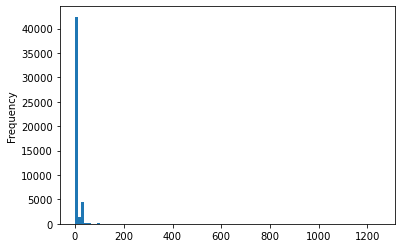

In [33]:
df['minimum_nights'].plot.hist(bins=100)

Text(0.5, 1.0, 'Histogram')

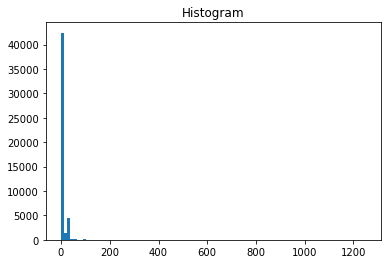

In [34]:
fig = plt.figure()
axes1 =fig.add_subplot(1,1,1)
axes1.hist(df['minimum_nights'],bins=100)
axes1.set_title('Histogram')

Text(0, 0.5, 'Frequency')

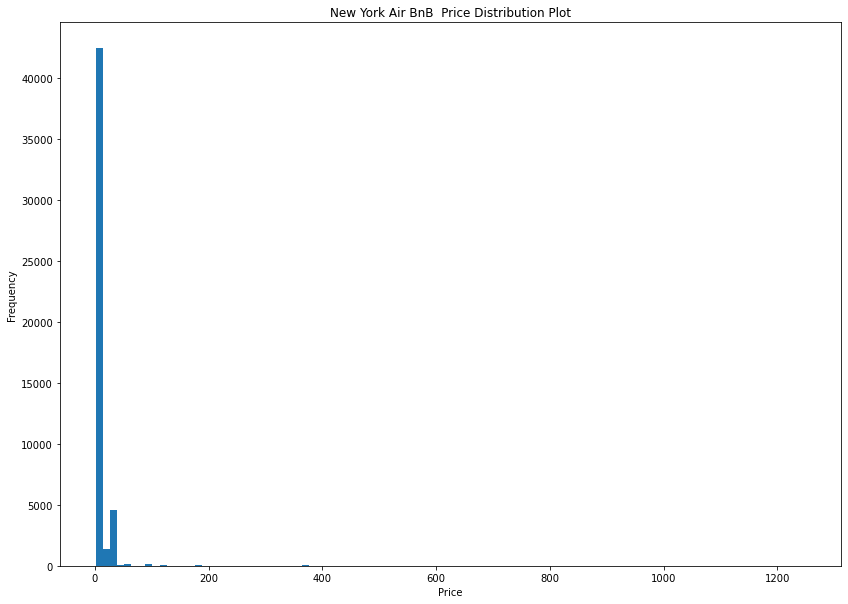

In [35]:
# Univarate Analysis 
#Plotting histogram using matplotlib
plt.figure(figsize=[14,10])
a = df['minimum_nights']
plt.hist(a, bins = 100)
plt.title("New York Air BnB  Price Distribution Plot")
plt.xlabel("Price")
plt.ylabel("Frequency")
# price is not show a normal distribution.

In [36]:
df['minimum_nights'].value_counts

<bound method IndexOpsMixin.value_counts of 0         1
1         1
2         3
3         1
4        10
         ..
48890     2
48891     4
48892    10
48893     1
48894     7
Name: minimum_nights, Length: 48895, dtype: int64>

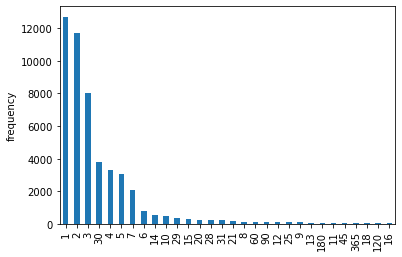

In [37]:
fig,ax = plt.subplots()
df['minimum_nights'].value_counts()[:30].plot(ax = ax, kind = 'bar', ylabel = 'frequency')
plt.show()

<AxesSubplot:>

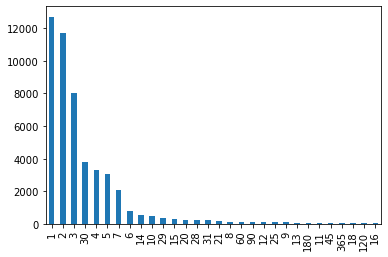

In [38]:
# Univarate Analysis 
#Plotting histogram
df['minimum_nights'].value_counts()[:30].plot(kind ='bar')

In [39]:
df['number_of_reviews'].describe()

count    48895.000000
mean        23.274466
std         44.550582
min          0.000000
25%          1.000000
50%          5.000000
75%         24.000000
max        629.000000
Name: number_of_reviews, dtype: float64

Text(0, 0.5, 'Frequency')

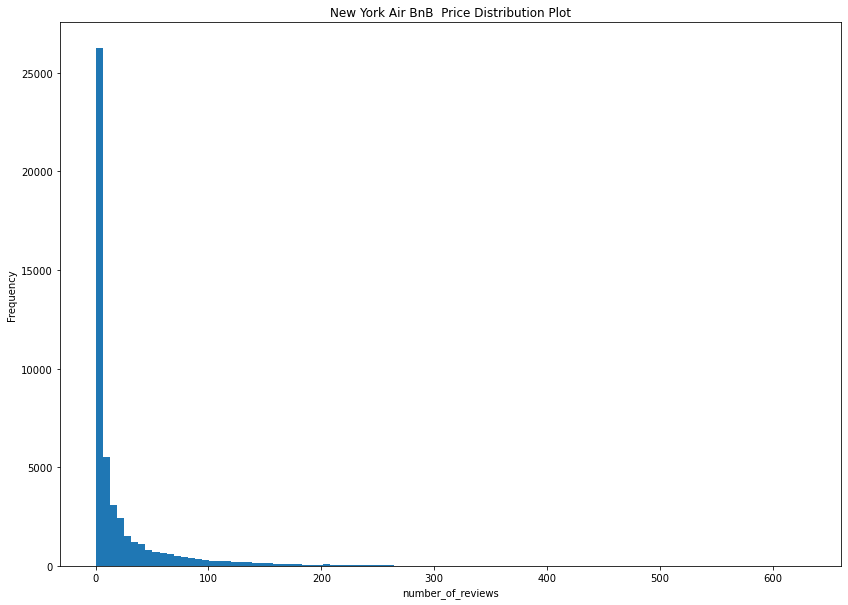

In [40]:
# Univarate Analysis 
#Plotting histogram using matplotlib
plt.figure(figsize=[14,10])
a = df['number_of_reviews']
plt.hist(a, bins = 100)
plt.title("New York Air BnB  Price Distribution Plot")
plt.xlabel("number_of_reviews")
plt.ylabel("Frequency")

<AxesSubplot:>

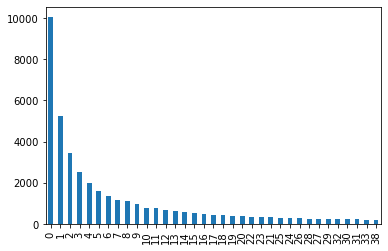

In [41]:
df['number_of_reviews'].value_counts()[:35].plot(kind ='bar')

In [42]:
df['availability_365'].describe()

count    48895.000000
mean       112.781327
std        131.622289
min          0.000000
25%          0.000000
50%         45.000000
75%        227.000000
max        365.000000
Name: availability_365, dtype: float64

Text(0, 0.5, 'Frequency')

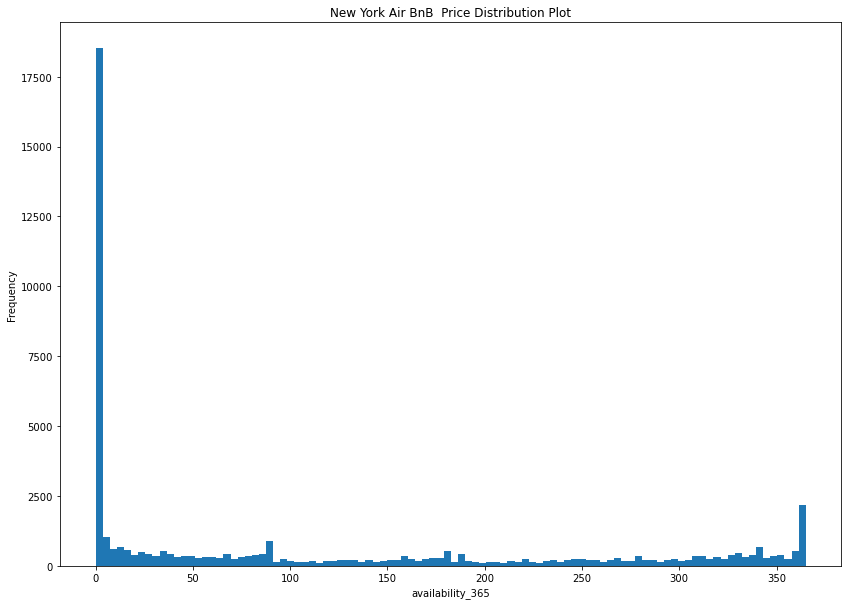

In [43]:
 #Univarate Analysis 
#Plotting histogram using matplotlib
plt.figure(figsize=[14,10])
c = df['availability_365']
plt.hist(c, bins = 100)
plt.title("New York Air BnB  Price Distribution Plot")
plt.xlabel("availability_365")
plt.ylabel("Frequency")

<AxesSubplot:>

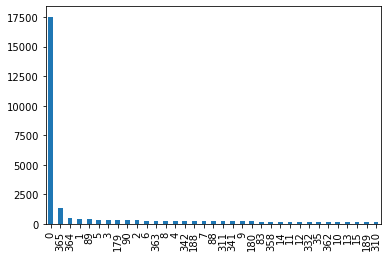

In [44]:
df['availability_365'].value_counts()[:35].plot(kind ='bar')

In [45]:
df['calculated_host_listings_count'].describe()

count    48895.000000
mean         7.143982
std         32.952519
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max        327.000000
Name: calculated_host_listings_count, dtype: float64

Text(0, 0.5, 'Frequency')

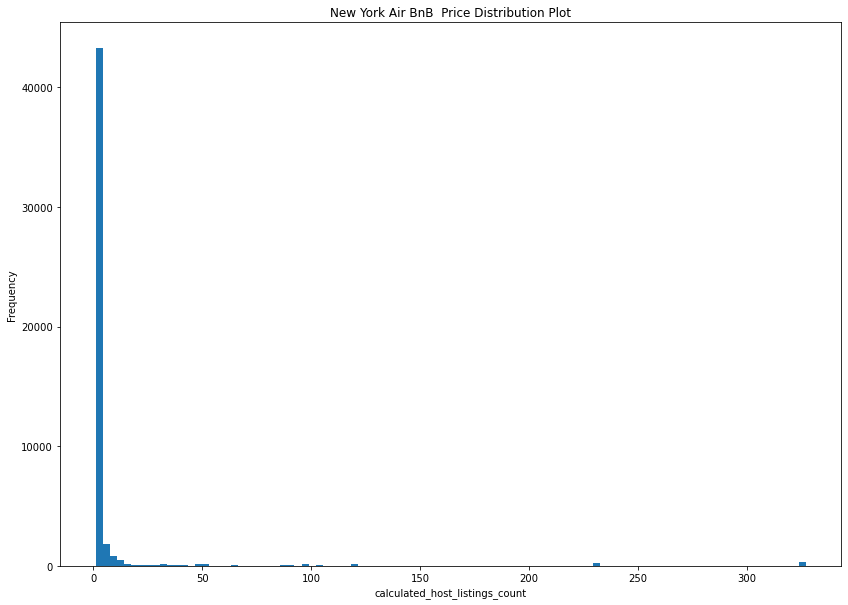

In [46]:
# Univarate Analysis 
#Plotting histogram using matplotlib
plt.figure(figsize=[14,10])
d = df['calculated_host_listings_count']
plt.hist(d, bins = 100)
plt.title("New York Air BnB  Price Distribution Plot")
plt.xlabel("calculated_host_listings_count")
plt.ylabel("Frequency")

<AxesSubplot:>

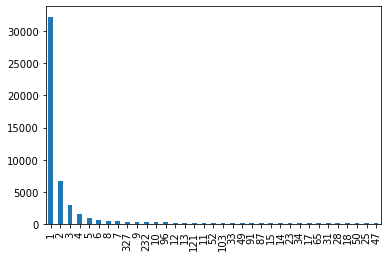

In [47]:
df['calculated_host_listings_count'].value_counts()[:35].plot(kind ='bar')

In [48]:
df['reviews_per_month'].describe()

count    48895.000000
mean         1.090910
std          1.597283
min          0.000000
25%          0.040000
50%          0.370000
75%          1.580000
max         58.500000
Name: reviews_per_month, dtype: float64

Text(0, 0.5, 'Frequency')

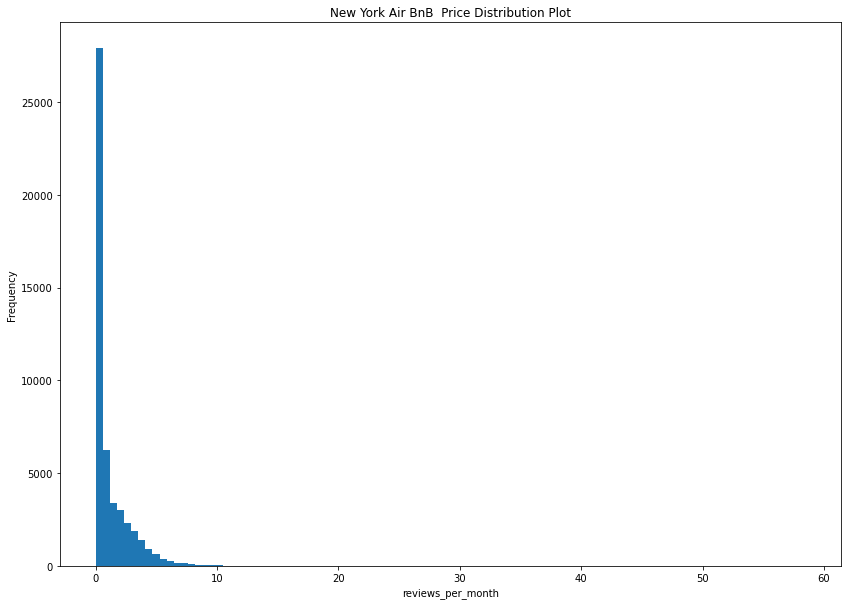

In [49]:
# Univarate Analysis 
#Plotting histogram using matplotlib
plt.figure(figsize=[14,10])
d = df['reviews_per_month']
plt.hist(d, bins = 100)
plt.title("New York Air BnB  Price Distribution Plot")
plt.xlabel("reviews_per_month")
plt.ylabel("Frequency")

<AxesSubplot:>

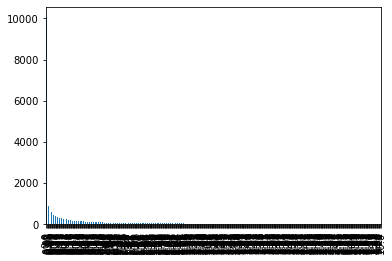

In [50]:
df['reviews_per_month'].value_counts()[:10].plot(kind ='bar')


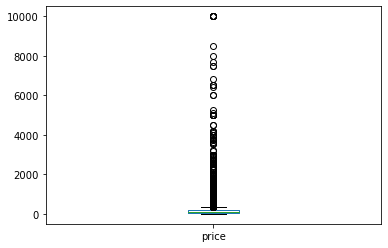

In [51]:
df['price'].plot(kind='box');

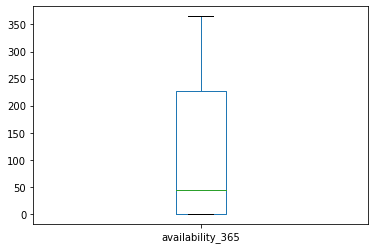

In [52]:
df['availability_365'].plot(kind='box');

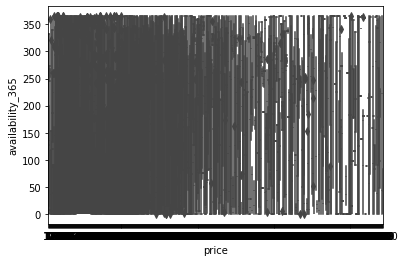

In [53]:
sns.boxplot(data=df, x='price', y='availability_365')
plt.show()

In [56]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,1970-01-01,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


Univarate Analysis: Categorical Variables

Univarate analysis for categorial variables via bar charts and value count. 

In [54]:
# Find unique values for neighbourhood group
df.neighbourhood_group.unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

<AxesSubplot:>

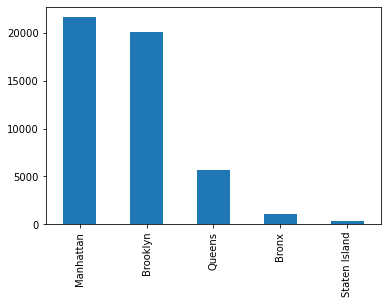

In [55]:
#Categorical Variable Univarate Analysis
df['neighbourhood_group'].value_counts()[:10].plot(kind ='bar')

<AxesSubplot:>

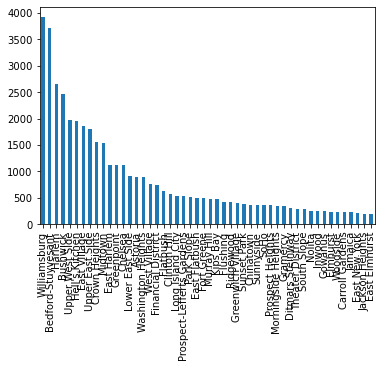

In [56]:
#Categorical Variable Univarate Analysis
df['neighbourhood'].value_counts()[:50].plot(kind ='bar')

In [57]:
# Find unique values for room type
df.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

<AxesSubplot:>

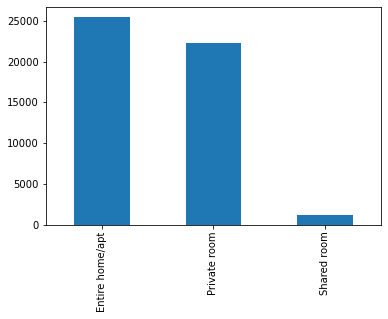

In [58]:
#Categorical Variable Univarate Analysis
df['room_type'].value_counts()[:10].plot(kind ='bar')

<AxesSubplot:>

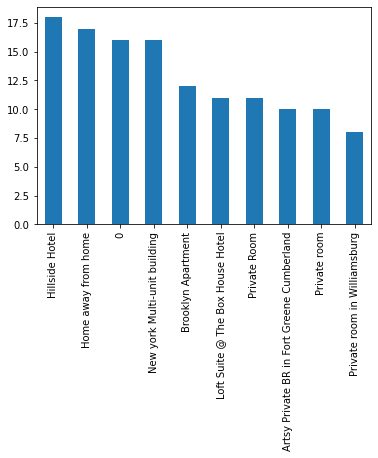

In [59]:
#Categorical Variable Univarate Analysis
df['name'].value_counts()[:10].plot(kind ='bar')

<AxesSubplot:>

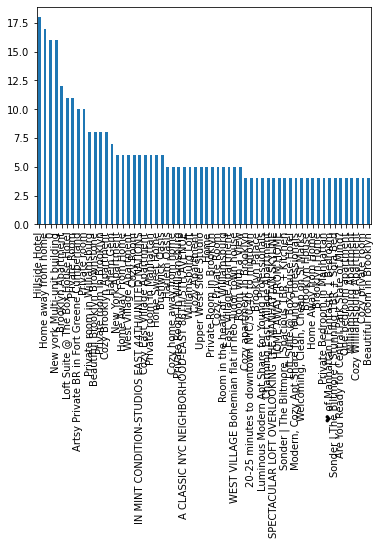

In [60]:
#Categorical Variable Univarate Analysis
df['name'].value_counts()[:60].plot(kind ='bar')

In [61]:
# Find unique values for host_name
df.host_name.unique()

array(['John', 'Jennifer', 'Elisabeth', ..., 'Abayomi', 'Alberth',
       'Ilgar & Aysel'], dtype=object)

<AxesSubplot:>

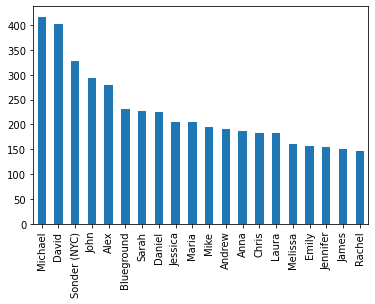

In [62]:
#Categorical Variable Univarate Analysis
#Host name has NAN values
df['host_name'].value_counts()[:20].plot(kind ='bar')

In [63]:
# Find unique values for neighbourhood group
df.calculated_host_listings_count.unique()

array([  6,   2,   1,   4,   3,   5,   7,  13,  28,  11,   8,   9,  52,
        18,  15,  19,  10,  39,  26,  29,  12,  21,  96,  14,  34,  43,
       121,  37,  49,  31,  91,  16,  87,  33,  23,  50,  20,  25, 232,
        17,  47, 103,  65,  30,  27, 327,  32], dtype=int64)

<AxesSubplot:>

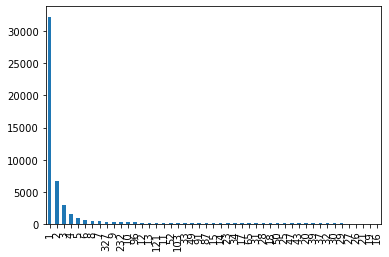

In [64]:
#Categorical Variable Univarate Analysis
df['calculated_host_listings_count'].value_counts().plot(kind ='bar')

In [65]:
#Categorical Variable Univarte Analysis
df['calculated_host_listings_count'].value_counts()

1      32303
2       6658
3       2853
4       1440
5        845
6        570
8        416
7        399
327      327
9        234
232      232
10       210
96       192
12       180
13       130
121      121
11       110
52       104
103      103
33        99
49        98
91        91
87        87
15        75
14        70
23        69
34        68
17        68
65        65
31        62
28        56
18        54
50        50
25        50
47        47
43        43
20        40
39        39
37        37
32        32
30        30
29        29
27        27
26        26
21        21
19        19
16        16
Name: calculated_host_listings_count, dtype: int64

In [66]:
#categorical Variable Univarate Analysis
df['last_review'].unique()

array(['2018-10-19T00:00:00.000000000', '2019-05-21T00:00:00.000000000',
       '1970-01-01T00:00:00.000000000', ...,
       '2017-12-23T00:00:00.000000000', '2018-01-29T00:00:00.000000000',
       '2018-03-29T00:00:00.000000000'], dtype='datetime64[ns]')

In [67]:
#categorical Variable Univarate Analysis
df['last_review'].value_counts()

1970-01-01    10052
2019-06-23     1413
2019-07-01     1359
2019-06-30     1341
2019-06-24      875
              ...  
2013-09-11        1
2012-09-14        1
2016-01-24        1
2015-01-09        1
2014-10-08        1
Name: last_review, Length: 1765, dtype: int64

<AxesSubplot:>

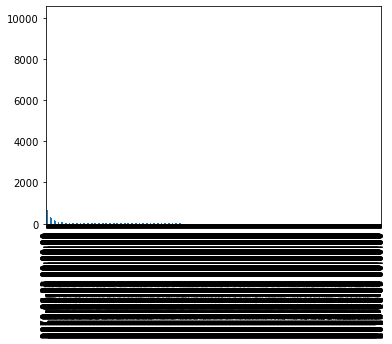

In [68]:
#Categorical Variable Univarate Analysis
df['last_review'].value_counts().plot(kind ='bar')

Bivarate Analysis

Bivarate Analysis using correleation coefficients,scatterplot,

In [70]:
# Bivarate analysis Correlation Such as heatmap, 
df.corr()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
id,1.000000,0.588290,-0.003125,0.090908,0.010619,-0.013224,-0.319760,0.180221,0.133272,0.085468
host_id,0.588290,1.000000,0.020224,0.127055,0.015309,-0.017364,-0.140106,0.209783,0.154950,0.203492
latitude,-0.003125,0.020224,1.000000,0.084788,0.033939,0.024869,-0.015389,-0.018758,0.019517,-0.010983
longitude,0.090908,0.127055,0.084788,1.000000,-0.150019,-0.062747,0.059094,0.138516,-0.114713,0.082731
price,0.010619,0.015309,0.033939,-0.150019,1.000000,0.042799,-0.047954,-0.050564,0.057472,0.081829
minimum_nights,-0.013224,-0.017364,0.024869,-0.062747,0.042799,1.000000,-0.080116,-0.124905,0.127960,0.144303
number_of_reviews,-0.319760,-0.140106,-0.015389,0.059094,-0.047954,-0.080116,1.000000,0.589407,-0.072376,0.172028
reviews_per_month,0.180221,0.209783,-0.018758,0.138516,-0.050564,-0.124905,0.589407,1.000000,-0.047312,0.163732
calculated_host_listings_count,0.133272,0.154950,0.019517,-0.114713,0.057472,0.127960,-0.072376,-0.047312,1.000000,0.225701
availability_365,0.085468,0.203492,-0.010983,0.082731,0.081829,0.144303,0.172028,0.163732,0.225701,1.000000


In [71]:
#Correleation Matrix
corr_matrix = df.corr()
corr_matrix['price'].sort_values(ascending=False)

price                             1.000000
availability_365                  0.081829
calculated_host_listings_count    0.057472
minimum_nights                    0.042799
latitude                          0.033939
host_id                           0.015309
id                                0.010619
number_of_reviews                -0.047954
reviews_per_month                -0.050564
longitude                        -0.150019
Name: price, dtype: float64

Observations: Correleation coefficient ranges from -1 to 1. When close to 1, then there is a strong positive correleation. In our case price is positively correleated to availability 365, calculated host listings count, minimum nights,latitude,host_id. Whereas it is negatively correlated to reviews per month, number of reviews and longitude. Meaning that price has a tendency to go down depending on the reviews. Price is goes down slightly when we go east or west. Whereas if go north or south ( latitude) price goes up slightly. 

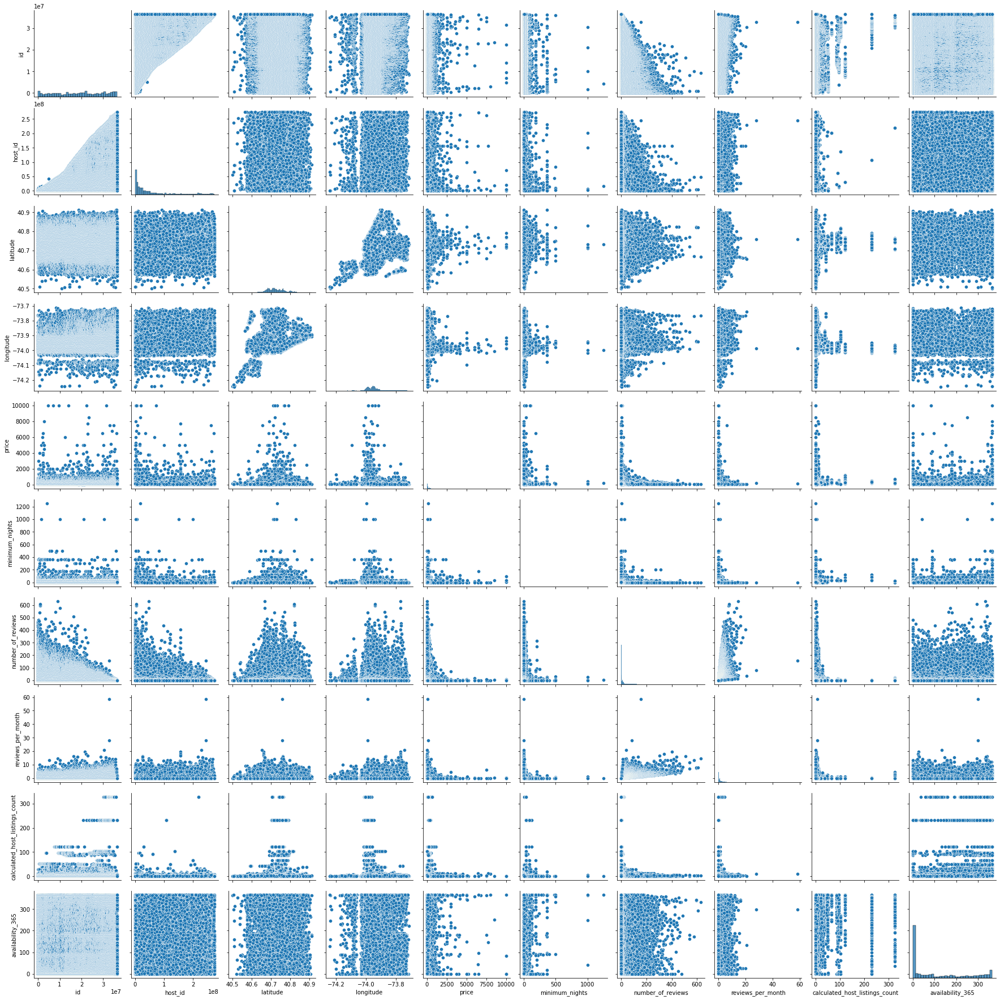

In [72]:
#Pairplot showing main feature correlation
sns.pairplot(df)


<AxesSubplot:>

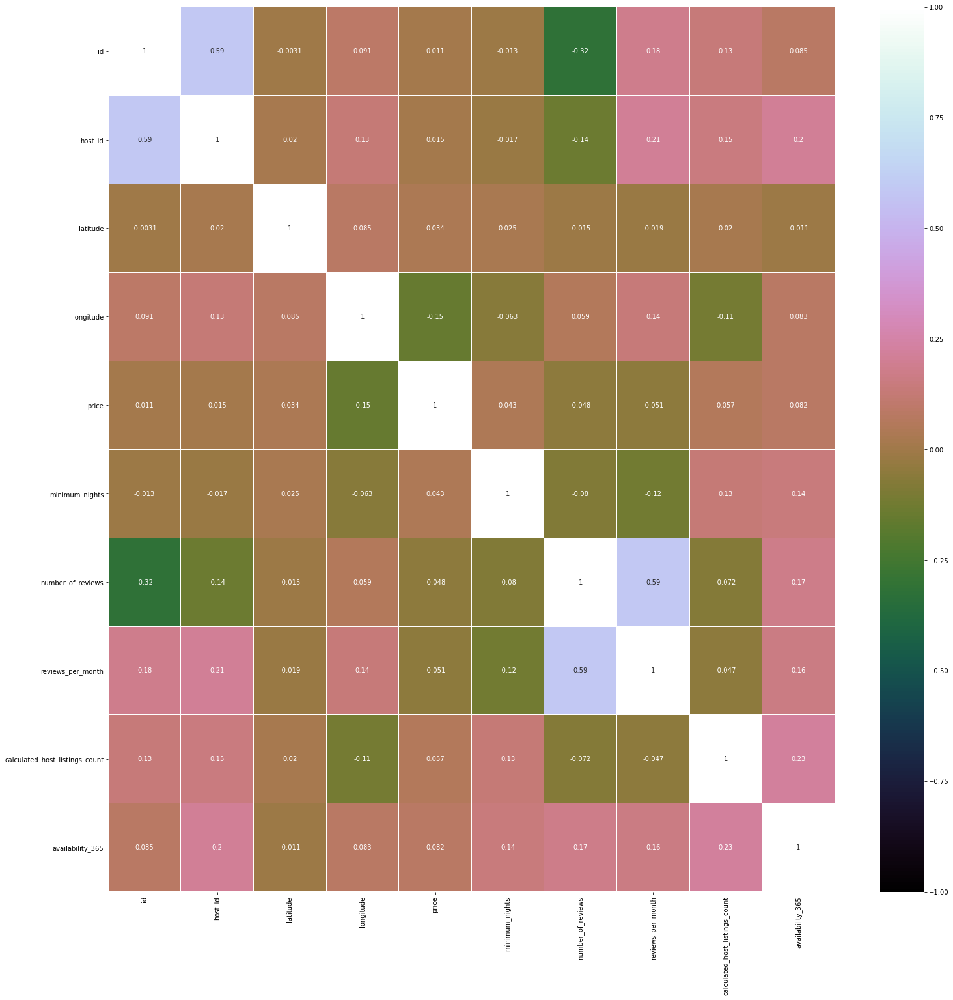

In [73]:
#Correlation and Heat map
df.corr()
plt.figure(figsize=(25,25))
sns.heatmap(df.corr(),vmin=-1, vmax=1, cmap="cubehelix", annot=True, linewidths=0.1)


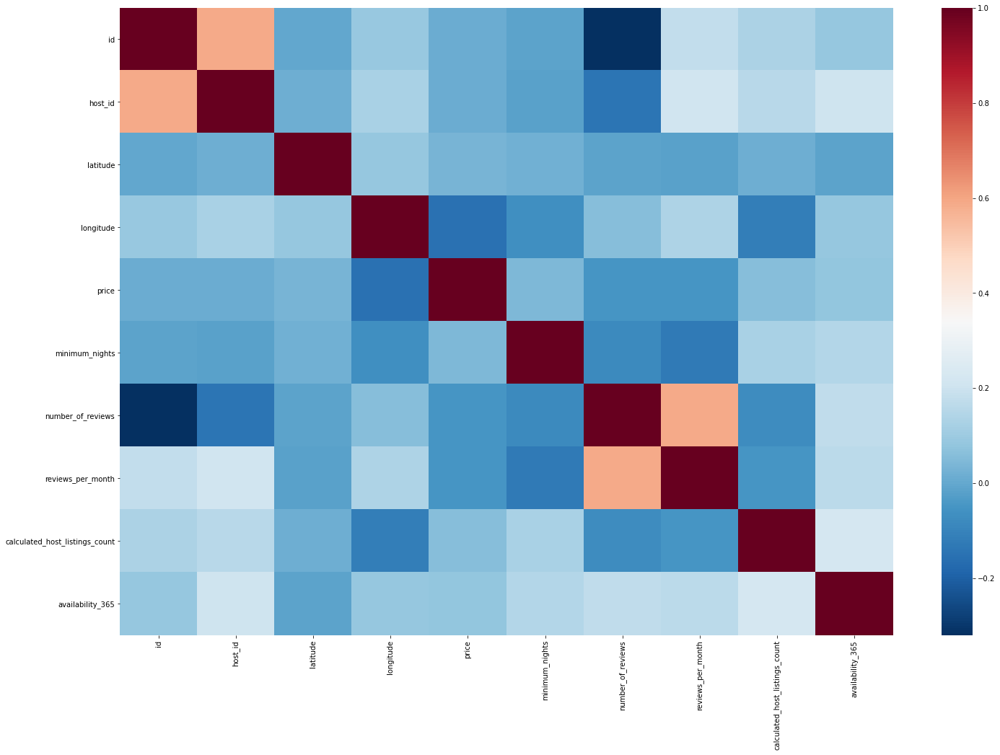

In [74]:
# Produce a correlation matrix of the dataset
corrs = df.corr()
# Convert the correlation matrix into a heatmap using Seaborn.
plt.figure(figsize=(24,16))
sns.heatmap(corrs, cmap='RdBu_r')
plt.show()

<AxesSubplot:>

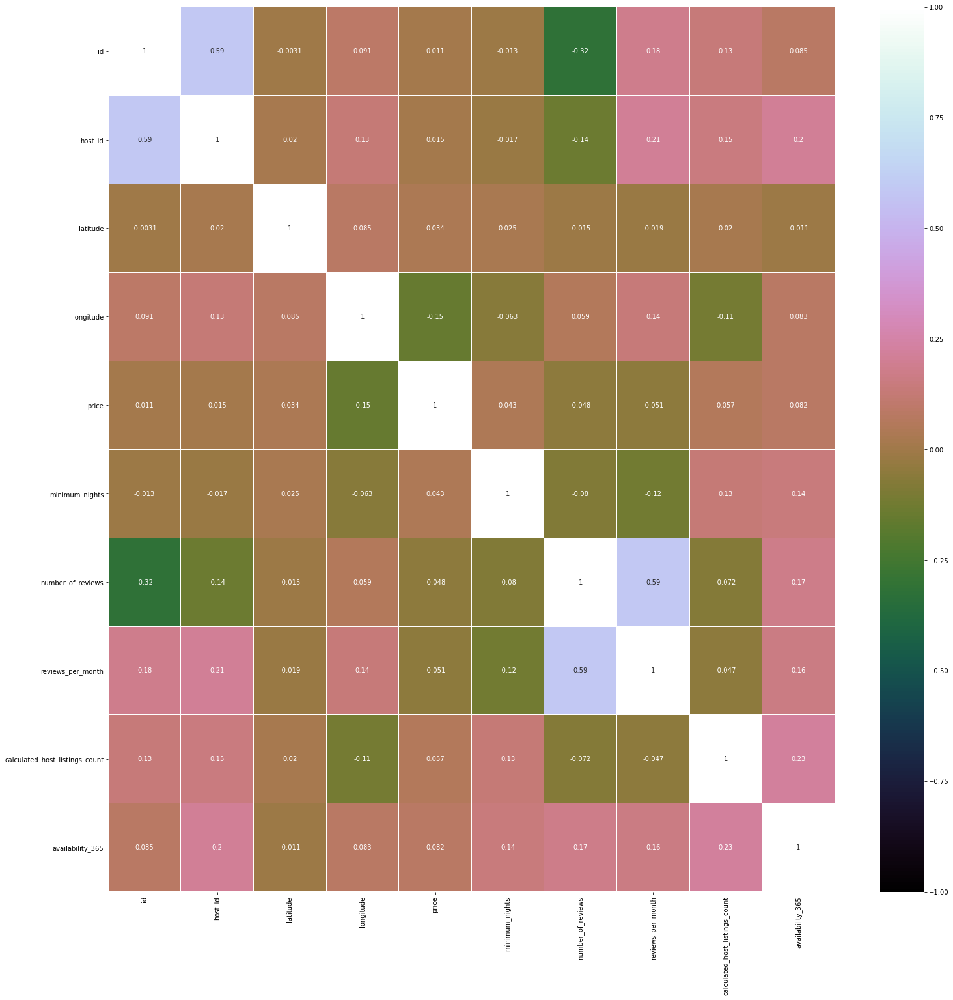

In [75]:
#Heatmap
plt.figure(figsize=(25,25))
sns.heatmap(corrs,vmin=-1, vmax=1, cmap="cubehelix", annot=True, linewidths=0.1)

Observations: No clear correlations exist between price and various variable shown here on the heatmap. Heatmap is not giving a clear correlation
Number of Reivews and Reviews per month are negatively correlated to price. If price goes up, then number of reviews goes down as well as reviews per month. Darker colour on heatmap also indicates correlation between price and reviews. But values are -0.043 and -0.031, seems like values are closer to zero. Linear trend is harder to establish. Longitude is negatively correlated and latitude is postively correleated. 

In [79]:
df.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=False)

neighbourhood_group
Manhattan        196.875814
Brooklyn         124.383207
Staten Island    114.812332
Queens            99.517649
Bronx             87.496792
Name: price, dtype: float64

In [80]:
pd.set_option('display.max_rows', 5000)

Bivarate Analysis for numerical-categorical column combinations

In [377]:
df.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=False)

neighbourhood_group
Manhattan        196.875814
Brooklyn         124.383207
Staten Island    114.812332
Queens            99.517649
Bronx             87.496792
Name: price, dtype: float64

In [81]:
df.groupby('neighbourhood')['price'].mean().sort_values(ascending=False)

neighbourhood
Fort Wadsworth                800.000000
Woodrow                       700.000000
Tribeca                       490.638418
Sea Gate                      487.857143
Riverdale                     442.090909
Prince's Bay                  409.500000
Battery Park City             367.557143
Flatiron District             341.925000
Randall Manor                 336.000000
NoHo                          295.717949
SoHo                          287.103352
Midtown                       282.719094
Neponsit                      274.666667
West Village                  267.682292
Greenwich Village             263.405612
Chelsea                       249.738544
Willowbrook                   249.000000
Theater District              248.013889
Nolita                        230.138340
Financial District            225.490591
Gramercy                      222.754438
Little Italy                  222.066116
Murray Hill                   220.958763
Breezy Point                  213.333333
Co

In [82]:
df.groupby('room_type')['price'].mean().sort_values(ascending=False)

room_type
Entire home/apt    211.794246
Private room        89.780973
Shared room         70.127586
Name: price, dtype: float64

Observations: Most expensive neighbourhood_group is Manhattan, Brookyln, Staten island, Queen, Bronx
Most expensive neighbourhood is fort Wadsworth,Woodrow,Tribeca,Sea Gate,Riverdal,Prince's Bay,Battery Park City and so on       Most expensive room_type to rent is: entire home/apt, private room and shared room.          

In [83]:
pd.set_option('display.max_rows', 5000)

In [84]:
df.groupby('host_name')['price'].mean().sort_values(ascending=False)

host_name
Olson                9999.0
Rum                  8500.0
Jay And Liz          6000.0
Sarah-B              5000.0
Sarah-2              5000.0
                      ...  
Carolann               12.0
Salim                  10.0
Vishanti & Jeremy      10.0
Aymeric                 0.0
Qiuchi                  0.0
Name: price, Length: 11453, dtype: float64

In [85]:
df.groupby('last_review')['price'].mean().sort_values(ascending=False)

last_review
2015-02-17    6000.000000
2013-09-28    5000.000000
2016-02-13    2602.500000
2017-01-27    1957.500000
2016-09-15    1398.166667
2016-01-28    1365.000000
2017-07-27    1048.272727
2014-08-23     800.000000
2017-12-09     797.142857
2015-01-02     755.352941
2018-09-18     708.071429
2014-06-27     650.000000
2018-03-13     626.000000
2018-01-19     580.000000
2015-10-09     570.166667
2017-03-11     560.000000
2016-12-10     529.142857
2016-12-09     526.750000
2014-09-27     500.000000
2015-03-25     500.000000
2017-01-06     493.000000
2018-03-26     488.428571
2015-08-20     482.200000
2016-10-19     457.333333
2014-07-08     450.000000
2016-10-12     438.857143
2015-04-11     425.000000
2015-12-06     423.571429
2017-04-09     411.500000
2017-02-11     406.666667
2016-01-01     395.897436
2012-09-18     387.500000
2015-02-16     385.000000
2015-12-03     375.600000
2013-10-01     375.000000
2014-09-09     370.000000
2014-09-07     350.000000
2012-09-23     350.000000


In [86]:
df.groupby('minimum_nights')['price'].mean().sort_values(ascending=False)

minimum_nights
99      5039.000000
114     4200.000000
100      936.533333
40       437.538462
1000     400.000000
70       395.750000
180      355.372093
175      350.000000
198      346.000000
365      342.482759
23       320.000000
120      300.571429
80       255.000000
366      250.000000
60       207.528302
90       204.692308
265      199.000000
480      199.000000
31       188.905473
50       188.357143
28       187.256158
29       185.391176
30       182.563564
360      180.600000
1250     180.000000
270      176.000000
36       175.000000
184      175.000000
153      175.000000
65       175.000000
6        170.417553
55       166.500000
4        161.191644
3        160.251281
5        157.310811
35       157.133333
19       157.125000
105      155.000000
11       154.060606
364      149.000000
2        146.270178
75       145.750000
53       145.000000
1        142.022877
7        141.192906
32       135.375000
10       133.884058
88       133.000000
200      128.000000
68   

In [87]:
df.groupby('calculated_host_listings_count')['price'].mean().sort_values(ascending=False)

calculated_host_listings_count
49     484.112245
11     453.581818
12     406.483333
232    303.150862
65     290.230769
121    277.528926
18     253.740741
327    253.195719
87     215.436782
30     213.133333
96     210.994792
33     201.838384
14     191.542857
39     190.769231
50     171.700000
31     159.354839
23     158.898551
1      158.677677
21     158.095238
20     154.500000
13     150.876923
6      149.477193
25     147.500000
91     146.241758
28     145.732143
2      127.799790
16     127.750000
52     126.134615
3      122.193831
29     121.965517
5      120.501775
10     120.009524
4      119.915972
9      118.320513
8      111.894231
7      104.378446
47     102.106383
34      95.764706
15      94.813333
19      88.789474
17      88.485294
26      62.346154
32      59.937500
43      48.139535
27      47.888889
103     43.825243
37      35.945946
Name: price, dtype: float64

In [88]:
df.groupby('availability_365')['price'].mean().sort_values(ascending=False)

availability_365
150    308.447368
251    307.034483
97     293.118644
83     279.622951
270    277.898734
146    269.821429
214    268.363636
364    260.372709
257    255.812500
365    250.769884
124    246.422222
215    242.576923
180    229.942708
204    228.022727
344    227.975000
256    225.702128
237    224.020833
222    218.761905
274    217.434783
173    214.266667
290    213.549020
185    213.229167
240    212.828571
358    212.594444
343    209.156716
199    208.904762
219    206.615385
303    206.561404
273    204.400000
253    203.560000
45     203.358696
217    202.704545
168    201.584906
362    201.096386
268    200.666667
363    200.644351
298    199.839286
178    198.858586
263    198.274194
191    197.957447
328    197.653846
179    197.408638
229    197.048780
277    196.348837
327    195.450549
264    195.070175
266    194.056604
194    192.181818
234    192.139535
243    192.116279
347    191.819048
267    190.312500
23     189.688889
116    189.244444
206    188.

In [89]:
df.groupby('last_review')['price'].mean().sort_values(ascending=False)

last_review
2015-02-17    6000.000000
2013-09-28    5000.000000
2016-02-13    2602.500000
2017-01-27    1957.500000
2016-09-15    1398.166667
2016-01-28    1365.000000
2017-07-27    1048.272727
2014-08-23     800.000000
2017-12-09     797.142857
2015-01-02     755.352941
2018-09-18     708.071429
2014-06-27     650.000000
2018-03-13     626.000000
2018-01-19     580.000000
2015-10-09     570.166667
2017-03-11     560.000000
2016-12-10     529.142857
2016-12-09     526.750000
2014-09-27     500.000000
2015-03-25     500.000000
2017-01-06     493.000000
2018-03-26     488.428571
2015-08-20     482.200000
2016-10-19     457.333333
2014-07-08     450.000000
2016-10-12     438.857143
2015-04-11     425.000000
2015-12-06     423.571429
2017-04-09     411.500000
2017-02-11     406.666667
2016-01-01     395.897436
2012-09-18     387.500000
2015-02-16     385.000000
2015-12-03     375.600000
2013-10-01     375.000000
2014-09-09     370.000000
2014-09-07     350.000000
2012-09-23     350.000000


In [90]:
df.groupby('reviews_per_month')['price'].mean().sort_values(ascending=False)

reviews_per_month
6.15     2531.666667
7.02      547.500000
7.86      500.000000
7.36      344.500000
10.54     330.000000
14.00     300.000000
5.29      291.857143
7.89      279.666667
6.84      274.500000
4.36      272.043478
7.22      264.000000
6.68      255.000000
8.29      237.500000
6.69      234.000000
6.12      231.666667
12.00     222.500000
5.89      221.000000
7.90      215.000000
2.62      213.130435
5.41      208.000000
5.91      206.600000
0.38      202.603687
7.99      200.000000
6.73      199.666667
5.24      199.600000
8.72      199.000000
27.95     199.000000
5.18      196.500000
5.70      195.428571
8.84      195.000000
0.00      192.919021
4.55      192.750000
7.83      191.666667
8.47      190.000000
3.51      189.791667
0.18      189.695082
3.46      188.000000
3.24      187.896552
3.57      187.222222
5.25      186.125000
8.92      185.000000
3.27      182.566667
4.59      182.117647
10.86     181.666667
1.59      181.525000
5.69      181.400000
6.38      181.16

In [91]:
df.groupby('number_of_reviews')['price'].mean().sort_values(ascending=False)

number_of_reviews
447    575.000000
264    325.000000
250    317.500000
299    260.000000
320    258.250000
285    233.333333
404    220.000000
287    204.666667
358    197.000000
324    193.500000
0      192.919021
246    191.000000
141    185.037037
302    181.000000
319    180.250000
237    179.750000
370    175.000000
363    175.000000
230    174.600000
176    171.466667
69     170.670886
398    169.000000
195    168.555556
268    168.333333
159    163.846154
130    163.281250
203    163.250000
396    163.000000
180    162.500000
215    162.000000
94     161.829787
182    160.692308
121    160.538462
261    160.000000
488    160.000000
127    159.629630
5      157.079728
17     155.223427
8      155.181012
84     154.680851
177    153.909091
6      153.364775
109    153.277778
10     152.625156
338    152.500000
28     151.903101
24     151.655738
124    151.531250
111    151.500000
252    151.000000
42     150.734375
95     150.703125
314    150.500000
240    150.500000
330    150

In [92]:
df.groupby('last_review')['price'].mean().sort_values(ascending=False)

last_review
2015-02-17    6000.000000
2013-09-28    5000.000000
2016-02-13    2602.500000
2017-01-27    1957.500000
2016-09-15    1398.166667
2016-01-28    1365.000000
2017-07-27    1048.272727
2014-08-23     800.000000
2017-12-09     797.142857
2015-01-02     755.352941
2018-09-18     708.071429
2014-06-27     650.000000
2018-03-13     626.000000
2018-01-19     580.000000
2015-10-09     570.166667
2017-03-11     560.000000
2016-12-10     529.142857
2016-12-09     526.750000
2014-09-27     500.000000
2015-03-25     500.000000
2017-01-06     493.000000
2018-03-26     488.428571
2015-08-20     482.200000
2016-10-19     457.333333
2014-07-08     450.000000
2016-10-12     438.857143
2015-04-11     425.000000
2015-12-06     423.571429
2017-04-09     411.500000
2017-02-11     406.666667
2016-01-01     395.897436
2012-09-18     387.500000
2015-02-16     385.000000
2015-12-03     375.600000
2013-10-01     375.000000
2014-09-09     370.000000
2014-09-07     350.000000
2012-09-23     350.000000


In [93]:
df.groupby(['number_of_reviews','reviews_per_month','last_review','price']).aggregate(['count','min','max','mean'])

id            \
                                                      count       min   
number_of_reviews reviews_per_month last_review price                   
0                 0.00              1970-01-01  0         1  20933849   
                                                10        5   1620248   
                                                11        2  27752128   
                                                12        3  16927533   
                                                15        3  29414633   
...                                                     ...       ...   
576               13.40             2019-06-27  47        1  10101135   
594               7.57              2019-06-15  49        1    891117   
597               7.72              2019-06-23  49        1    903947   
607               7.75              2019-06-21  49        1    903972   
629               14.58             2019-07-05  47        1   9145202   

                                                                               \
                                                            max          mean   
number_of_reviews reviews_per_month last_review price                           
0                 0.00              1970-01-01  0      20933849  2.093385e+07   
                                                10     27316669  1.816459e+07   
                                                11     35042058  3.139709e+07   
                                                12     35612982  2.484074e+07   
                                                15     36022650  3.333818e+07   
...                                                         ...           ...   
576               13.40             2019-06-27  47     10101135  1.010114e+07   
594               7.57              2019-06-15  49       891117  8.911170e+05   
597               7.72              2019-06-23  49       903947  9.039470e+05   
607               7.75              2019-06-21  49       903972  9.039720e+05   
629               14.58             2019-07-05  47      9145202  9.145202e+06   

                                                      host_id            \
                                                        count       min   
number_of_reviews reviews_per_month last_review price                     
0                 0.00              1970-01-01  0           1  13709292   
                                                10          5   2196224   
                                                11          2     19342   
                                                12          3   2066240   
                                                15          3   2967377   
...                                                       ...       ...   
576               13.40             2019-06-27  47          1  47621202   
594               7.57              2019-06-15  49          1   4734398   
597               7.72              2019-06-23  49          1   4734398   
607               7.75              2019-06-21  49          1   4734398   
629               14.58             2019-07-05  47          1  47621202   

                                                                  \
                                                             max   
number_of_reviews reviews_per_month last_review price              
0                 0.00              1970-01-01  0       13709292   
                                                10     205820814   
                                                11     205706382   
                                                12     108512889   
                                                15     257474717   
...                                                          ...   
576               13.40             2019-06-27  47      47621202   
594               7.57              2019-06-15  49       4734398   
597               7.72              2019-06-23  49       4734398   
607               7.75          

In [378]:
df.groupby(['neighbourhood_group','room_type','price']).aggregate(['count','min','max','mean'])

host_id                        \
                                            count        min        max   
neighbourhood_group room_type       price                                 
Bronx               Entire home/apt 28          1   97907084   97907084   
                                    35          1  249297875  249297875   
                                    37          1   50742613   50742613   
                                    39          1     389924     389924   
                                    40          3  152045247  229480146   
                                    42          2   44217272  120035273   
                                    47          1   91320722   91320722   
                                    48          1    2988712    2988712   
                                    49          1    3684360    3684360   
                                    50          4  138962369  156396144   
                                    55          2  224206042  271667012   
                                    57          1    2988712    2988712   
                                    58          2    3495471   48677247   
                                    59          1   18506733   18506733   
                                    60         12    2556784  252897042   
                                    62          2   15544818   16997863   
                                    63          1    5309143    5309143   
                                    65          6   23693099  241458287   
                                    67          2   73126926  233665357   
                                    68          1   74489237   74489237   
                                    69          6     785524  267744284   
                                    70          5     740812   57882444   
                                    71          2    2988712   80061565   
                                    72          2     740812    2988712   
                                    74          2  132669029  234376122   
                                    75         20   11017415  264809787   
                                    76          3    5437444  110539055   
                                    77          1     716306     716306   
                                    79          6   60501531  267710728   
                                    80         15    6313448  255216752   
                                    81          1   63952962   63952962   
                                    84          3    2780938  106460468   
                                    85         14    1468472  272308792   
                                    86          2  101289150  159495469   
                                    87          5     153817  215951448   
                                    88          3    8187861   53717769   
                                    89          3   29510402   78154356   
                                    90          9     369015  248286585   
                                    92          1  256836581  256836581   
                                    93          1  245369413  245369413   
                                    95         11    1776707  254622508   
                                    98          2  225309985  273354185   
                                    99         11    5944946  264088176   
                                    100        25    1812871  273841667   
                                    101         1  246653349  246653349   
                                    102         2   14214034   24195130   
                                    103         2    6762900  249500015   
                                    104         1   11305944   11305944   
                                    105         7     310670  146675319   
                                    107         3   12463953  179677211   
                                    109         3     971075  26461

In [94]:
df.groupby(['neighbourhood_group','neighbourhood','room_type','price']).aggregate(['count','min','max','mean'])

id            \
                                                        count       min   
neighbourhood_group neighbourhood room_type       price                   
Bronx               Allerton      Entire home/apt 49        1    755528   
                                                  55        1  29800915   
                                                  60        1  33363084   
                                                  70        1  21830694   
                                                  75        2  27343189   
...                                                       ...       ...   
Staten Island       West Brighton Private room    200       1  19236716   
                    Westerleigh   Entire home/apt 103       1  18993379   
                                  Private room    40        1  22420304   
                    Willowbrook   Entire home/apt 249       1  27088022   
                    Woodrow       Entire home/apt 700       1   1798271   

                                                                               \
                                                              max        mean   
neighbourhood_group neighbourhood room_type       price                         
Bronx               Allerton      Entire home/apt 49       755528    755528.0   
                                                  55     29800915  29800915.0   
                                                  60     33363084  33363084.0   
                                                  70     21830694  21830694.0   
                                                  75     30109916  28726552.5   
...                                                           ...         ...   
Staten Island       West Brighton Private room    200    19236716  19236716.0   
                    Westerleigh   Entire home/apt 103    18993379  18993379.0   
                                  Private room    40     22420304  22420304.0   
                    Willowbrook   Entire home/apt 249    27088022  27088022.0   
                    Woodrow       Entire home/apt 700     1798271   1798271.0   

                                                        host_id             \
                                                          count        min   
neighbourhood_group neighbourhood room_type       price                      
Bronx               Allerton      Entire home/apt 49          1    3684360   
                                                  55          1  224206042   
                                                  60          1  242175033   
                                                  70          1   57882444   
                                                  75          2   22694324   
...                                                         ...        ...   
Staten Island       West Brighton Private room    200         1  134672751   
                    Westerleigh   Entire home/apt 103         1  132266502   
                                  Private room    40          1  164164069   
                    Willowbrook   Entire home/apt 249         1  115827173   
                    Woodrow       Entire home/apt 700         1    9430973   

                                                                    \
                                                               max   
neighbourhood_group neighbourhood room_type       price              
Bronx               Allerton      Entire home/apt 49       3684360   
                                                  55     224206042   
                                                  60     242175033   
                                                  70      57882444   
                                                  75     204036615   
...                                                            ...   
Staten Island       West Brighton Private room    200    134672751   
                    Westerleigh   Entire home/apt 103    132266502   
          

In [95]:
df.groupby(['neighbourhood_group','neighbourhood','room_type','price']).aggregate(['count','min','max','mean'])

id            \
                                                        count       min   
neighbourhood_group neighbourhood room_type       price                   
Bronx               Allerton      Entire home/apt 49        1    755528   
                                                  55        1  29800915   
                                                  60        1  33363084   
                                                  70        1  21830694   
                                                  75        2  27343189   
...                                                       ...       ...   
Staten Island       West Brighton Private room    200       1  19236716   
                    Westerleigh   Entire home/apt 103       1  18993379   
                                  Private room    40        1  22420304   
                    Willowbrook   Entire home/apt 249       1  27088022   
                    Woodrow       Entire home/apt 700       1   1798271   

                                                                               \
                                                              max        mean   
neighbourhood_group neighbourhood room_type       price                         
Bronx               Allerton      Entire home/apt 49       755528    755528.0   
                                                  55     29800915  29800915.0   
                                                  60     33363084  33363084.0   
                                                  70     21830694  21830694.0   
                                                  75     30109916  28726552.5   
...                                                           ...         ...   
Staten Island       West Brighton Private room    200    19236716  19236716.0   
                    Westerleigh   Entire home/apt 103    18993379  18993379.0   
                                  Private room    40     22420304  22420304.0   
                    Willowbrook   Entire home/apt 249    27088022  27088022.0   
                    Woodrow       Entire home/apt 700     1798271   1798271.0   

                                                        host_id             \
                                                          count        min   
neighbourhood_group neighbourhood room_type       price                      
Bronx               Allerton      Entire home/apt 49          1    3684360   
                                                  55          1  224206042   
                                                  60          1  242175033   
                                                  70          1   57882444   
                                                  75          2   22694324   
...                                                         ...        ...   
Staten Island       West Brighton Private room    200         1  134672751   
                    Westerleigh   Entire home/apt 103         1  132266502   
                                  Private room    40          1  164164069   
                    Willowbrook   Entire home/apt 249         1  115827173   
                    Woodrow       Entire home/apt 700         1    9430973   

                                                                    \
                                                               max   
neighbourhood_group neighbourhood room_type       price              
Bronx               Allerton      Entire home/apt 49       3684360   
                                                  55     224206042   
                                                  60     242175033   
                                                  70      57882444   
                                                  75     204036615   
...                                                            ...   
Staten Island       West Brighton Private room    200    134672751   
                    Westerleigh   Entire home/apt 103    132266502   
          

In [96]:
#Likelihood of Price based on neighbourhood group, neighbour,room_type,host_id
df.groupby(['neighbourhood_group','room_type','neighbourhood'])['price'].mean().sort_values(ascending=False)

neighbourhood_group  room_type        neighbourhood             
Bronx                Private room     Riverdale                     803.500000
Staten Island        Entire home/apt  Fort Wadsworth                800.000000
Bronx                Shared room      Riverdale                     800.000000
Staten Island        Entire home/apt  Woodrow                       700.000000
                                      Randall Manor                 651.000000
Brooklyn             Entire home/apt  Sea Gate                      649.400000
Manhattan            Entire home/apt  Tribeca                       561.818182
Staten Island        Entire home/apt  Prince's Bay                  506.666667
Manhattan            Entire home/apt  Battery Park City             488.541667
                                      Flatiron District             388.000000
                                      SoHo                          365.618257
Queens               Entire home/apt  Bayside                     

In [97]:
#Likelihood of Price based on neighbourhood group, neighbour,room_type,host_id
df.groupby(['neighbourhood_group','room_type','neighbourhood'])['price'].max().sort_values(ascending=False)

neighbourhood_group  room_type        neighbourhood             
Queens               Private room     Astoria                       10000
Brooklyn             Entire home/apt  Greenpoint                    10000
Manhattan            Entire home/apt  Upper West Side               10000
                                      East Harlem                    9999
                     Private room     Lower East Side                9999
                     Entire home/apt  Lower East Side                9999
                                      Tribeca                        8500
Brooklyn             Entire home/apt  Clinton Hill                   8000
Manhattan            Entire home/apt  Upper East Side                7703
Brooklyn             Private room     East Flatbush                  7500
Manhattan            Entire home/apt  Battery Park City              7500
                                      Chelsea                        6800
                     Private room     Upper Wes

In [98]:
#Likelihood of Price based on neighbourhood group, neighbour,room_type,host_id
df.groupby(['neighbourhood_group','room_type','neighbourhood'])['price'].min().sort_values(ascending=False)

neighbourhood_group  room_type        neighbourhood             
Bronx                Shared room      Riverdale                     800
Staten Island        Entire home/apt  Fort Wadsworth                800
                                      Woodrow                       700
                                      South Beach                   275
Brooklyn             Shared room      Vinegar Hill                  250
Staten Island        Entire home/apt  Willowbrook                   249
                                      New Brighton                  249
Queens               Entire home/apt  Neponsit                      200
                     Private room     Breezy Point                  195
                     Entire home/apt  Bay Terrace                   184
Bronx                Entire home/apt  West Farms                    165
Queens               Shared room      Bellerose                     150
Bronx                Entire home/apt  Hunts Point                   150

In [99]:
df.groupby(['neighbourhood_group','room_type','neighbourhood'])['price'].count().sort_values(ascending=False)

neighbourhood_group  room_type        neighbourhood             
Brooklyn             Private room     Bedford-Stuyvesant            2038
                                      Williamsburg                  1997
                     Entire home/apt  Williamsburg                  1891
                     Private room     Bushwick                      1719
                     Entire home/apt  Bedford-Stuyvesant            1591
Manhattan            Private room     Harlem                        1573
                     Entire home/apt  Upper East Side               1310
                                      Upper West Side               1256
                                      Hell's Kitchen                1187
                                      East Village                  1170
                                      Midtown                       1100
                                      Harlem                        1036
                                      Chelsea              

In [100]:

pd.set_option('display.max_rows', 5000)

In [101]:
df.groupby(['neighbourhood_group','room_type','neighbourhood','host_id'])['price'].mean().sort_values(ascending=False)

neighbourhood_group  room_type        neighbourhood    host_id 
Manhattan            Entire home/apt  Upper West Side  72390391    10000.0
Brooklyn             Entire home/apt  Greenpoint       5143901     10000.0
Queens               Private room     Astoria          20582832    10000.0
Manhattan            Private room     Lower East Side  3906464      9999.0
                     Entire home/apt  Lower East Side  4382127      9999.0
                                                                    ...   
                     Shared room      Hell's Kitchen   47336995       10.0
                     Private room     Kips Bay         91034542       10.0
Queens               Entire home/apt  Jamaica          97001292       10.0
Manhattan            Entire home/apt  Murray Hill      13709292        0.0
Brooklyn             Entire home/apt  Williamsburg     10132166        0.0
Name: price, Length: 39703, dtype: float64

In [102]:
df.groupby(['neighbourhood_group','room_type','neighbourhood','host_id'])['price'].max().sort_values(ascending=False)

neighbourhood_group  room_type        neighbourhood    host_id 
Manhattan            Entire home/apt  Upper West Side  72390391    10000
Brooklyn             Entire home/apt  Greenpoint       5143901     10000
Queens               Private room     Astoria          20582832    10000
Manhattan            Entire home/apt  Lower East Side  4382127      9999
                     Private room     Lower East Side  3906464      9999
                                                                   ...  
                                      SoHo             84497333       10
                     Shared room      Hell's Kitchen   47336995       10
Brooklyn             Entire home/apt  Greenpoint       11967922       10
                                      Williamsburg     10132166        0
Manhattan            Entire home/apt  Murray Hill      13709292        0
Name: price, Length: 39703, dtype: int64

In [103]:
df.groupby(['neighbourhood_group','room_type','neighbourhood','host_id'])['price'].min().sort_values(ascending=False)

neighbourhood_group  room_type        neighbourhood       host_id 
Brooklyn             Entire home/apt  Greenpoint          5143901     10000
Manhattan            Entire home/apt  Upper West Side     72390391    10000
Queens               Private room     Astoria             20582832    10000
Manhattan            Entire home/apt  Lower East Side     4382127      9999
                                      East Harlem         1235070      9999
                                                                      ...  
Brooklyn             Private room     Bushwick            15787004        0
Manhattan            Entire home/apt  Murray Hill         13709292        0
Brooklyn             Private room     Bedford-Stuyvesant  86327101        0
                                                          8993084         0
                     Entire home/apt  Williamsburg        10132166        0
Name: price, Length: 39703, dtype: int64

In [104]:
df.groupby(['neighbourhood_group','room_type','neighbourhood','host_id'])['price'].count().sort_values(ascending=False)

neighbourhood_group  room_type        neighbourhood       host_id  
Manhattan            Entire home/apt  Financial District  219517861    210
Brooklyn             Entire home/apt  Greenpoint          7503643       52
Manhattan            Entire home/apt  Financial District  12243051      51
                                      Murray Hill         219517861     50
                                      Midtown             205031545     49
                                                                      ... 
Brooklyn             Private room     Flatbush            57630325       1
                                                          59442523       1
                                                          60404912       1
                                                          63480384       1
Staten Island        Shared room      South Beach         46723570       1
Name: price, Length: 39703, dtype: int64

In [105]:
df.groupby(['host_id','host_name','name','neighbourhood'])['price'].max().sort_values(ascending=False)

host_id    host_name     name                                                neighbourhood     
72390391   Jelena        1-BR Lincoln Center                                 Upper West Side       10000
5143901    Erin          Luxury 1 bedroom apt. -stunning Manhattan views     Greenpoint            10000
20582832   Kathrine      Furnished room in Astoria apartment                 Astoria               10000
1235070    Olson         Spanish Harlem Apt                                  East Harlem            9999
4382127    Matt          2br - The Heart of NYC: Manhattans Lower East Side  Lower East Side        9999
                                                                                                   ...  
101970559  Sergii        Coliving in Brooklyn! Modern design / Shared room   Bushwick                  0
15787004   Martial Loft  MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)     Bushwick                  0
10132166   Aymeric       Modern apartment in the heart of Willia

In [106]:
df.groupby(['host_id','host_name','name','neighbourhood'])['price'].min().sort_values(ascending=False)

host_id    host_name  name                                                neighbourhood     
5143901    Erin       Luxury 1 bedroom apt. -stunning Manhattan views     Greenpoint            10000
20582832   Kathrine   Furnished room in Astoria apartment                 Astoria               10000
72390391   Jelena     1-BR Lincoln Center                                 Upper West Side       10000
3906464    Amy        Quiet, Clean, Lit @ LES & Chinatown                 Lower East Side        9999
1235070    Olson      Spanish Harlem Apt                                  East Harlem            9999
                                                                                                ...  
86327101   Adeyemi    Spacious comfortable master bedroom with nice view  Bedford-Stuyvesant        0
131697576  Anisha     ★Hostel Style Room | Ideal Traveling Buddies★       East Morrisania           0
10132166   Aymeric    Modern apartment in the heart of Williamsburg       Williamsburg     

In [107]:
df.groupby(['host_id','host_name','name','neighbourhood'])['price'].mean().sort_values(ascending=False)

host_id    host_name     name                                                neighbourhood     
72390391   Jelena        1-BR Lincoln Center                                 Upper West Side       10000.0
5143901    Erin          Luxury 1 bedroom apt. -stunning Manhattan views     Greenpoint            10000.0
20582832   Kathrine      Furnished room in Astoria apartment                 Astoria               10000.0
4382127    Matt          2br - The Heart of NYC: Manhattans Lower East Side  Lower East Side        9999.0
1235070    Olson         Spanish Harlem Apt                                  East Harlem            9999.0
                                                                                                    ...   
101970559  Sergii        Best Coliving space ever! Shared room.              Bushwick                  0.0
                         Coliving in Brooklyn! Modern design / Shared room   Bushwick                  0.0
15787004   Martial Loft  MARTIAL LOFT 3: REDEMPT

In [108]:
df.groupby(['host_id','host_name','name','neighbourhood','neighbourhood_group'])['price'].max().sort_values(ascending=False)

host_id    host_name     name                                                neighbourhood       neighbourhood_group
72390391   Jelena        1-BR Lincoln Center                                 Upper West Side     Manhattan              10000
5143901    Erin          Luxury 1 bedroom apt. -stunning Manhattan views     Greenpoint          Brooklyn               10000
20582832   Kathrine      Furnished room in Astoria apartment                 Astoria             Queens                 10000
1235070    Olson         Spanish Harlem Apt                                  East Harlem         Manhattan               9999
4382127    Matt          2br - The Heart of NYC: Manhattans Lower East Side  Lower East Side     Manhattan               9999
                                                                                                                        ...  
101970559  Sergii        Coliving in Brooklyn! Modern design / Shared room   Bushwick            Brooklyn                   0
1

In [109]:
df.groupby(['host_id','host_name','name','neighbourhood','neighbourhood_group'])['price'].min().sort_values(ascending=False)

host_id    host_name  name                                                neighbourhood       neighbourhood_group
5143901    Erin       Luxury 1 bedroom apt. -stunning Manhattan views     Greenpoint          Brooklyn               10000
20582832   Kathrine   Furnished room in Astoria apartment                 Astoria             Queens                 10000
72390391   Jelena     1-BR Lincoln Center                                 Upper West Side     Manhattan              10000
3906464    Amy        Quiet, Clean, Lit @ LES & Chinatown                 Lower East Side     Manhattan               9999
1235070    Olson      Spanish Harlem Apt                                  East Harlem         Manhattan               9999
                                                                                                                     ...  
86327101   Adeyemi    Spacious comfortable master bedroom with nice view  Bedford-Stuyvesant  Brooklyn                   0
131697576  Anisha     ★Ho

In [110]:
df.groupby(['host_id','host_name','name','neighbourhood','neighbourhood_group'])['price'].mean().sort_values(ascending=False)

host_id    host_name     name                                                neighbourhood       neighbourhood_group
72390391   Jelena        1-BR Lincoln Center                                 Upper West Side     Manhattan              10000.0
5143901    Erin          Luxury 1 bedroom apt. -stunning Manhattan views     Greenpoint          Brooklyn               10000.0
20582832   Kathrine      Furnished room in Astoria apartment                 Astoria             Queens                 10000.0
4382127    Matt          2br - The Heart of NYC: Manhattans Lower East Side  Lower East Side     Manhattan               9999.0
1235070    Olson         Spanish Harlem Apt                                  East Harlem         Manhattan               9999.0
                                                                                                                         ...   
101970559  Sergii        Best Coliving space ever! Shared room.              Bushwick            Brooklyn          

In [111]:
df.groupby(['id','host_id','host_name','name','neighbourhood','neighbourhood_group'])['price'].mean().sort_values(ascending=False)

id        host_id    host_name  name                                                neighbourhood       neighbourhood_group
7003697   20582832   Kathrine   Furnished room in Astoria apartment                 Astoria             Queens                 10000
13894339  5143901    Erin       Luxury 1 bedroom apt. -stunning Manhattan views     Greenpoint          Brooklyn               10000
22436899  72390391   Jelena     1-BR Lincoln Center                                 Upper West Side     Manhattan              10000
31340283  4382127    Matt       2br - The Heart of NYC: Manhattans Lower East Side  Lower East Side     Manhattan               9999
9528920   3906464    Amy        Quiet, Clean, Lit @ LES & Chinatown                 Lower East Side     Manhattan               9999
                                                                                                                               ...  
20624541  10132166   Aymeric    Modern apartment in the heart of Williamsburg 

Observations: Various combinations of price,neighbourhood_group,neighbourhood,host_name,host_id are listed above. Manhattan is the most costliest place to live followed by brooklyn, queens and staten island. Top neighbourhood is Ford wadsworth, seagate. Most popular type of room type is entire home/apartment

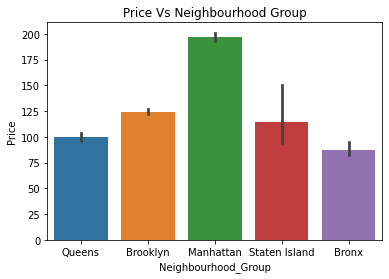

In [113]:
#Box Plots 
ax = sns.barplot(x="neighbourhood_group", y="price", data=df.sort_values('price',ascending=False))
_ = ax.set(xlabel='Neighbourhood_Group', ylabel='Price',title = "Price Vs Neighbourhood Group")

In [ ]:
Observation of the plot: Manhattan,brooklyn,staten island, queens followed by bronx are the most expensive.

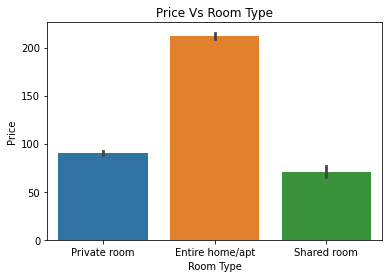

In [114]:
#Box Plots 
ax = sns.barplot(x="room_type", y="price", data=df.sort_values('price',ascending=False))
_ = ax.set(xlabel='Room Type', ylabel='Price',title = "Price Vs Room Type")

Observation: Entire room/apartment are the most expensive to rent followed by private room and then finally shared room 

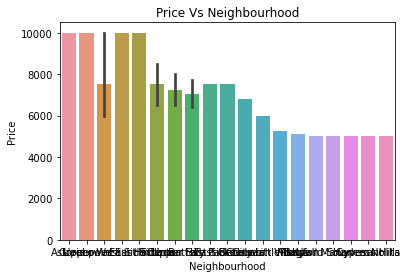

In [115]:
#Box Plots 
ax = sns.barplot(x="neighbourhood", y="price", data=df.sort_values('price',ascending=False)[:25])
_ = ax.set(xlabel='Neighbourhood', ylabel='Price',title aa= "Price Vs Neighbourhood")

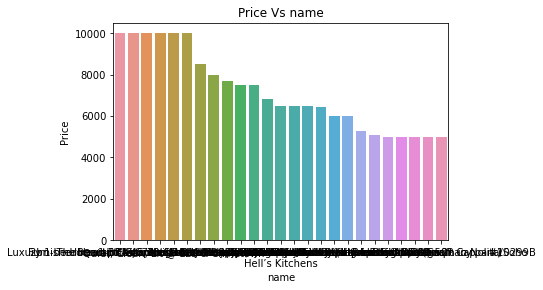

In [116]:
#Box Plots 
ax = sns.barplot(x="name", y="price", data=df.sort_values('price',ascending=False)[:25])
_ = ax.set(xlabel='name', ylabel='Price',title = "Price Vs name")

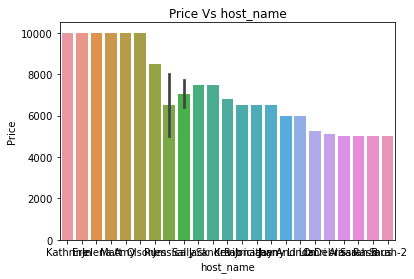

In [117]:
#Box Plots 
ax = sns.barplot(x="host_name", y="price", data=df.sort_values('price',ascending=False)[:25])
_ = ax.set(xlabel='host_name', ylabel='Price',title = "Price Vs host_name")

Observation of bar plot: Various plot have been plotted to understand the features better and how they get effected. 

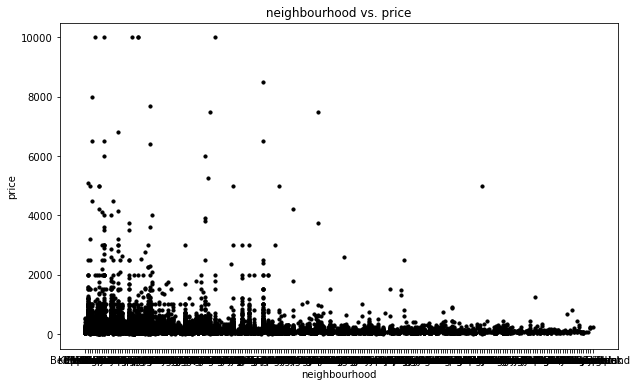

In [119]:
#Scatter Plots
fig = plt.figure(figsize=(10,6))
scatter = plt.scatter(df['neighbourhood'],df['price'],s=10,c='black') 
plt.title(' neighbourhood vs. price ')
plt.xlabel("neighbourhood")
plt.ylabel("price")
plt.show()

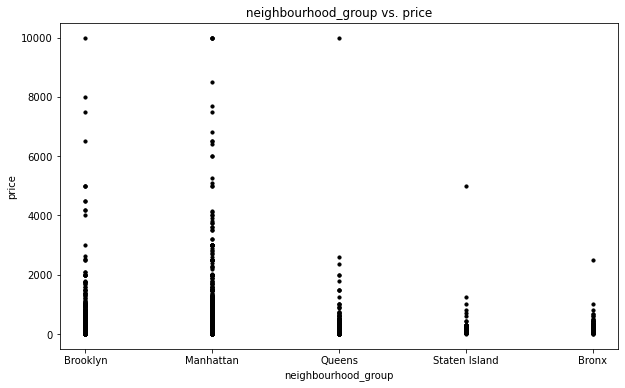

In [120]:
#Scatter Plots
fig = plt.figure(figsize=(10,6))
scatter = plt.scatter(df['neighbourhood_group'],df['price'],s=10,c='black') 
plt.title(' neighbourhood_group vs. price ')
plt.xlabel("neighbourhood_group")
plt.ylabel("price")
plt.show()

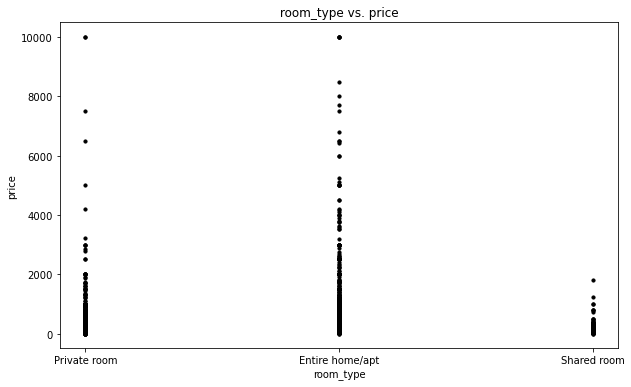

In [121]:
#Scatter Plots
fig = plt.figure(figsize=(10,6))
scatter = plt.scatter(df['room_type'],df['price'],s=10,c='black') 
plt.title(' room_type vs. price ')
plt.xlabel("room_type")
plt.ylabel("price")
plt.show()

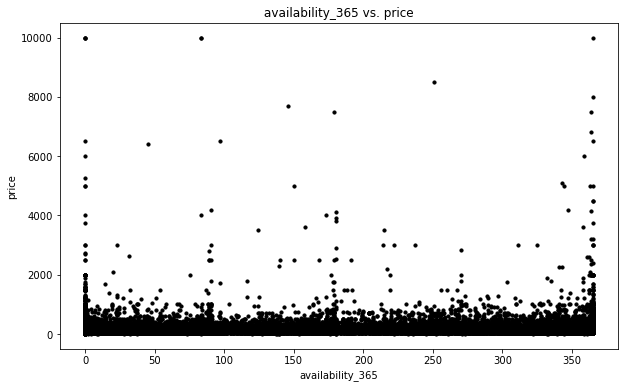

In [122]:
#Scatter Plots
fig = plt.figure(figsize=(10,6))
scatter = plt.scatter(df['availability_365'],df['price'],s=10,c='black') 
plt.title(' availability_365 vs. price ')
plt.xlabel("availability_365")
plt.ylabel("price")
plt.show()

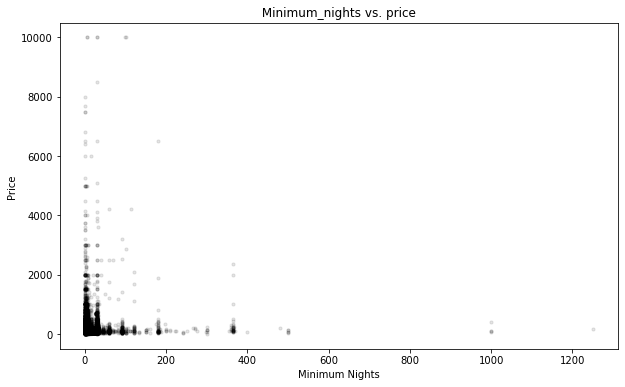

In [123]:
#Scatter Plots
fig = plt.figure(figsize=(10,6))
scatter = plt.scatter(df['minimum_nights'],df['price'],s=10,c='black',alpha=0.1) 
plt.title(' Minimum_nights vs. price ')
plt.xlabel("Minimum Nights")
plt.ylabel("Price")
plt.show()

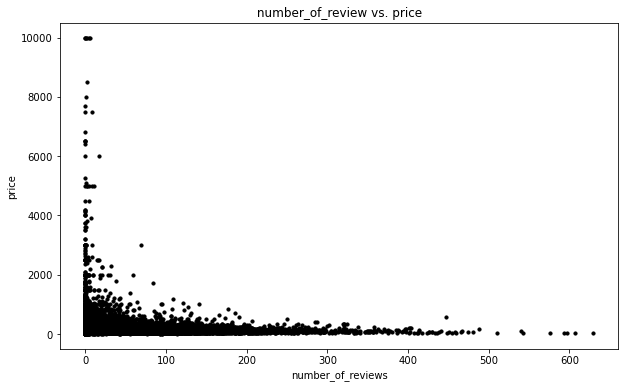

In [124]:
#Scatter Plots
fig = plt.figure(figsize=(10,6))
scatter = plt.scatter(df['number_of_reviews'],df['price'],s=10,c='black') 
plt.title(' number_of_review vs. price ')
plt.xlabel("number_of_reviews")
plt.ylabel("price")
plt.show()

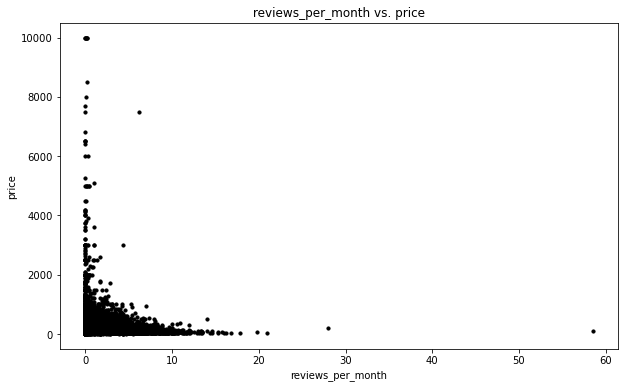

In [125]:
#Scatter Plots
fig = plt.figure(figsize=(10,6))
scatter = plt.scatter(df['reviews_per_month'],df['price'],s=10,c='black') 
plt.title(' reviews_per_month vs. price ')
plt.xlabel("reviews_per_month")
plt.ylabel("price")
plt.show()

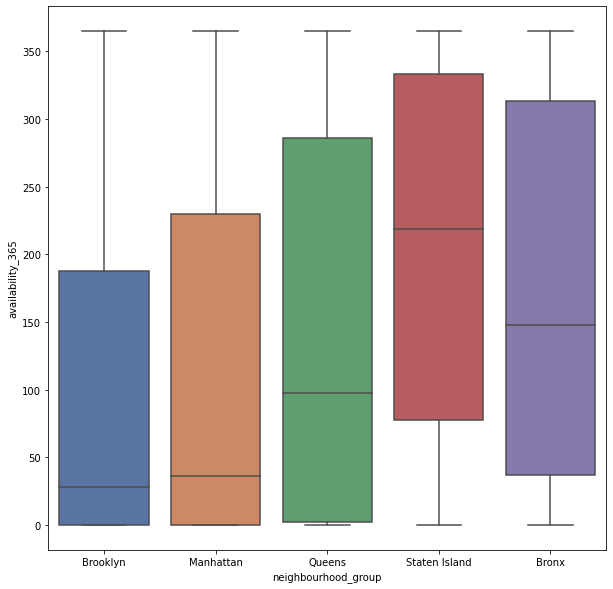

In [127]:
#BoxPlot
plt.figure(figsize=(10,10))
ax = sns.boxplot(data=df, x='neighbourhood_group',y='availability_365',palette='deep')

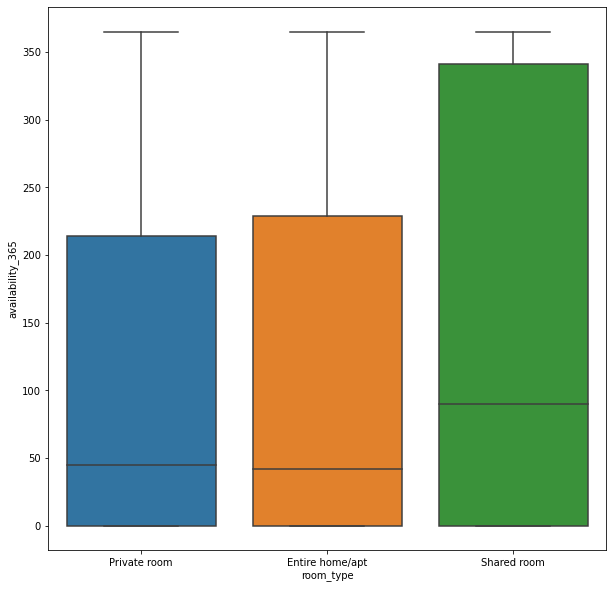

In [128]:
#BoxPlot between two variables
plt.figure(figsize=(10,10))
ax = sns.boxplot(data=df, x='room_type',y='availability_365')

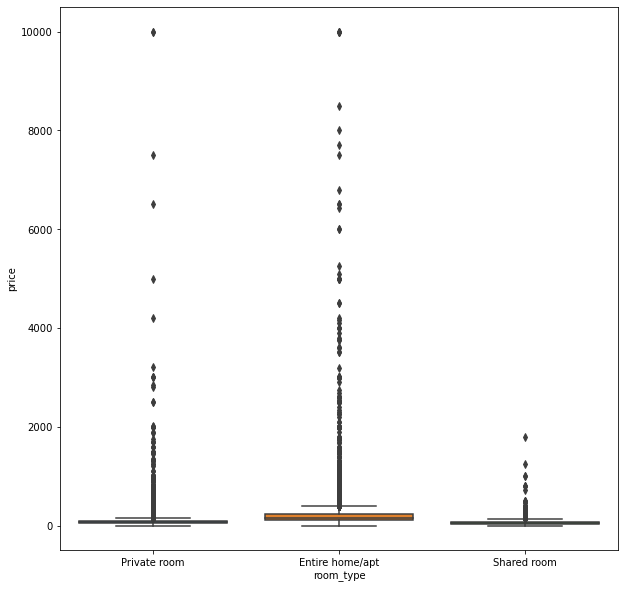

In [129]:
plt.figure(figsize=(10,10))
ax = sns.boxplot(data=df, x='room_type',y='price')

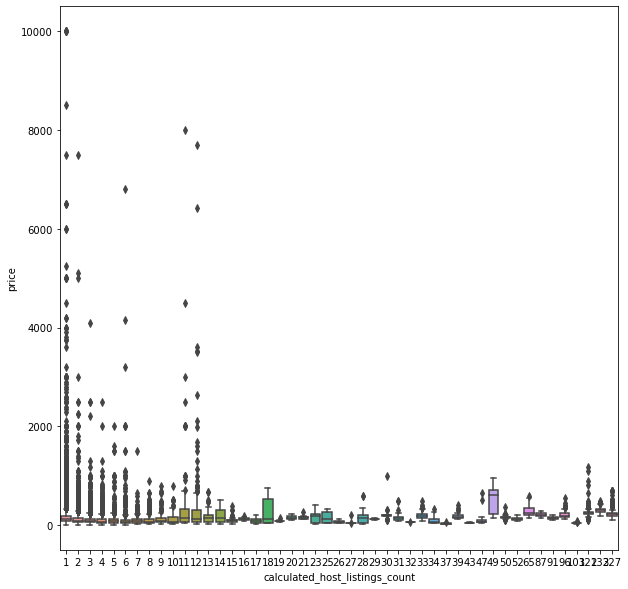

In [130]:
#BoxPlot between two variables
plt.figure(figsize=(10,10))
ax = sns.boxplot(data=df, x='calculated_host_listings_count',y='price')

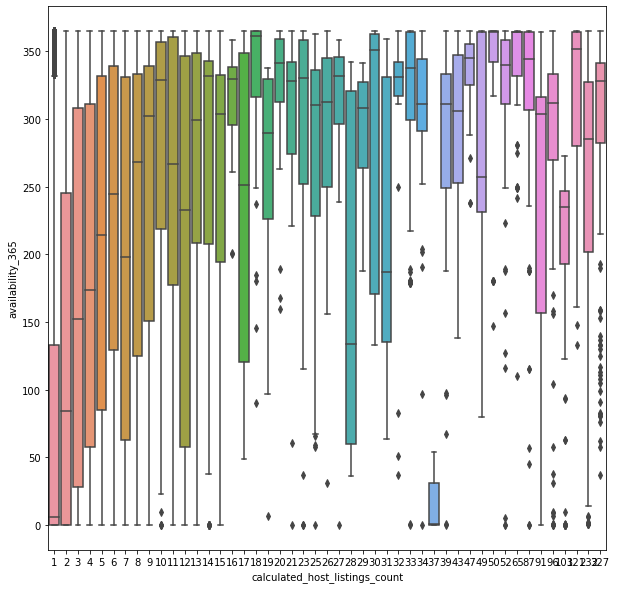

In [131]:
#BoxPlot between two variables
plt.figure(figsize=(10,10))
ax = sns.boxplot(data=df, x='calculated_host_listings_count',y='availability_365')

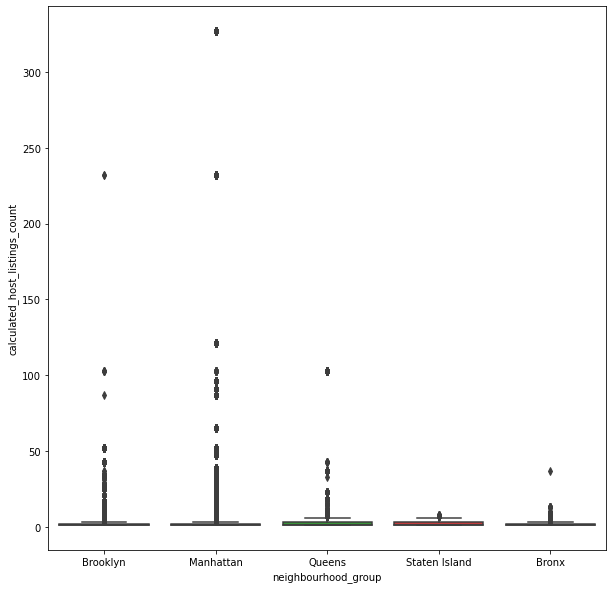

In [132]:
plt.figure(figsize=(10,10))
ax = sns.boxplot(data=df, x='neighbourhood_group',y='calculated_host_listings_count')

Categorical variable that are important are room_type,neighbhourhood_group.
Numerical vairables are host_id,avliability 365, number_of_reviews,minimum nights
Target: Price



<AxesSubplot:xlabel='longitude', ylabel='latitude'>

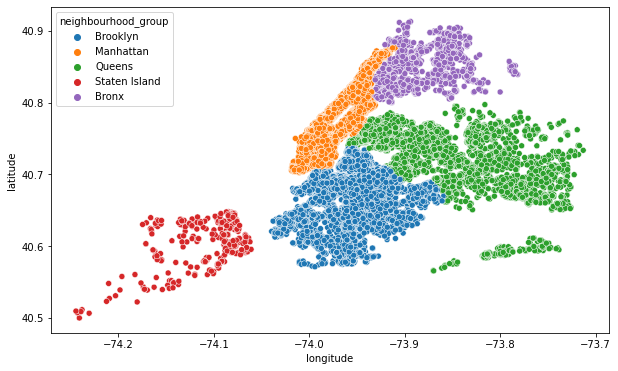

In [133]:
plt.figure(figsize=(10,6))
sns.scatterplot(data = df, x = 'longitude', y ='latitude', hue= 'neighbourhood_group')


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

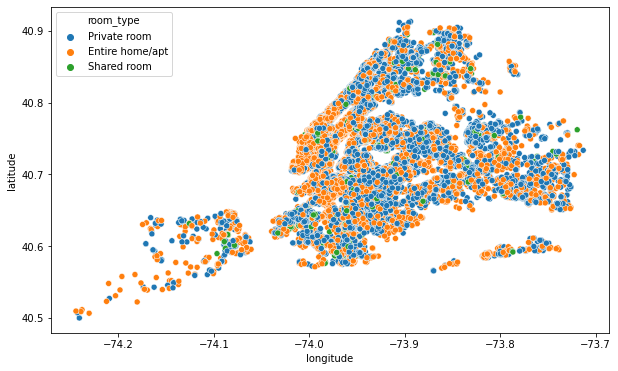

In [134]:
plt.figure(figsize=(10,6))
sns.scatterplot(data = df, x = 'longitude', y ='latitude', hue= 'room_type')

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

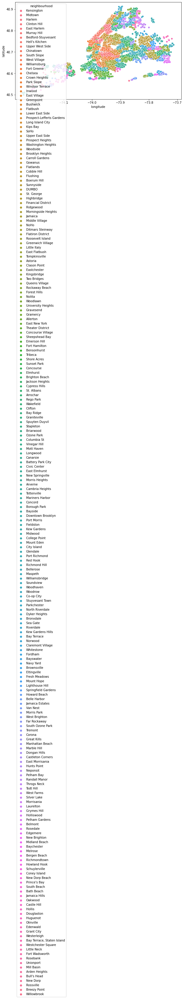

In [135]:
#Plotting Scatterplot Using Seaborn
plt.figure(figsize=(10,6))
sns.scatterplot(data = df, x = 'longitude', y ='latitude', hue= 'neighbourhood')

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

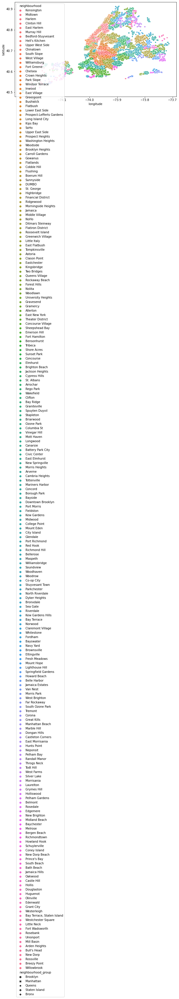

In [136]:
#Plotting Scatterplot Using Seaborn
plt.figure(figsize=(10,6))
sns.scatterplot(data = df, x = 'longitude', y ='latitude', hue= 'neighbourhood',style='neighbourhood_group')

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

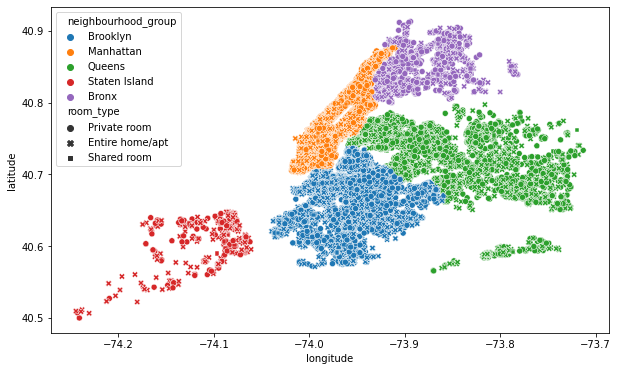

In [137]:
#Plotting Scatterplot Using Seaborn
plt.figure(figsize=(10,6))
sns.scatterplot(data = df, x = 'longitude', y ='latitude', hue= 'neighbourhood_group', style='room_type')

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

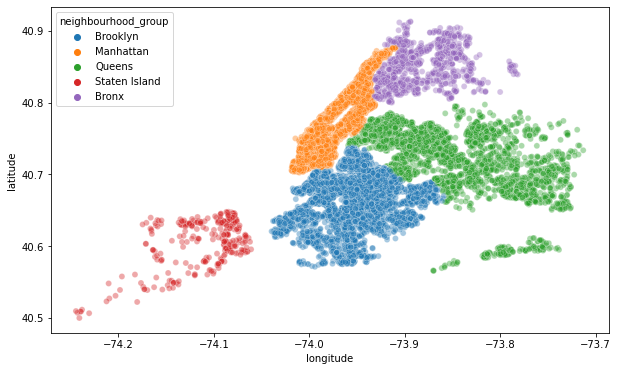

In [138]:
#Plotting Scatterplot Using Seaborn
plt.figure(figsize=(10,6))
sns.scatterplot(data = df, x = 'longitude', y ='latitude', hue= 'neighbourhood_group', alpha = 0.4)

Visualizing geographical Data shows in the above graph the density of datapoints. Brooklyn,Manhattan,Queens are densely populated.

In [139]:
# Passing the original df to df1
df1 = df

In [140]:
df1.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,1970-01-01,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


Feature Selection

Feature Selection is in order to acheive efficient data reduction. It helps to remove irrelevant,redundant or noisy features. It helps with better model interpretability, better model performance, no mutlicollinearity issues and overall a more effective features to predict the model. 

Feature's were explored on basis of: 
1. High correlation values ( Spearman Corrleation)
2. High multicollinearity ( Variance Inflation Factor Calculation)
3. Dimensionality Reduction by PCA to see if the model performs better if features are reduced

Bivariate Correleation Analysis

Correlation analysis is done to see the relationship between the variables. It is also a way to check high correlations within the features to perform feature selection. Spearman's rank correlation is a non-parametric version of the Pearson's correlation. It basically uses rank values of each feature rather than the original value for each feature to calculate correlation. Spearman correlation is used for ordinal,interval or ratio variables, while pearson is used for continuous variables. 

Breakdown of Variables: 
Categorical Variables or Nominal Variables: Name,Neighbourhood_group,Neighbourhood,host_name,room_type
Continous Variable: Price,Latitude,Longitude
Discrete features: Minimum_nights, calculated_host_listings_count,number_of_reviews,availability_365
Ordinal: reviews_per_month


Sources:
Stephanie Glen. "Spearman Rank Correlation (Spearman’s Rho): Definition and How to Calculate it" From StatisticsHowTo.com: Elementary Statistics for the rest of us! https://www.statisticshowto.com/probability-and-statistics/correlation-coefficient-formula/spearman-rank-correlation-definition-calculate/

In [141]:
# List of all features
features = [col for col in df1.columns if col != 'price']

# List of binary features
nominal_features = ['neighbourhood_group','neighbourhood','host_name','room_type','name']

#Discrete features
discrete_features =['minimum_nights','calculated_host_listings_count','number_of_reviews','availability_365']

#Continuous features
continuous_features=['price','latitude','longitude']

#Target 
target = ['price']

# List ordinal features
ordinal_features = ['reviews_per_month']

print(f"""

All features:
{features}

Discrete ratio features:
  >> analyzed in multicollinearity analysis
{discrete_features}

Ordinal features:
  >> not statistically appropriate for multicollinearity analysis
{ordinal_features}

Nominal features:
  >> not statistically appropriate for multicollinearity analysis
{nominal_features}

""")



All features:
['id', 'name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude', 'room_type', 'minimum_nights', 'number_of_reviews', 'last_review', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

Discrete ratio features:
  >> analyzed in multicollinearity analysis
['minimum_nights', 'calculated_host_listings_count', 'number_of_reviews', 'availability_365']

Ordinal features:
  >> not statistically appropriate for multicollinearity analysis
['reviews_per_month']

Nominal features:
  >> not statistically appropriate for multicollinearity analysis
['neighbourhood_group', 'neighbourhood', 'host_name', 'room_type', 'name']




latitude                          0.14
minimum_nights                    0.10
availability_365                  0.09
id                               -0.02
number_of_reviews                -0.06
reviews_per_month                -0.06
host_id                          -0.07
calculated_host_listings_count   -0.11
longitude                        -0.44
Name: price, dtype: float64


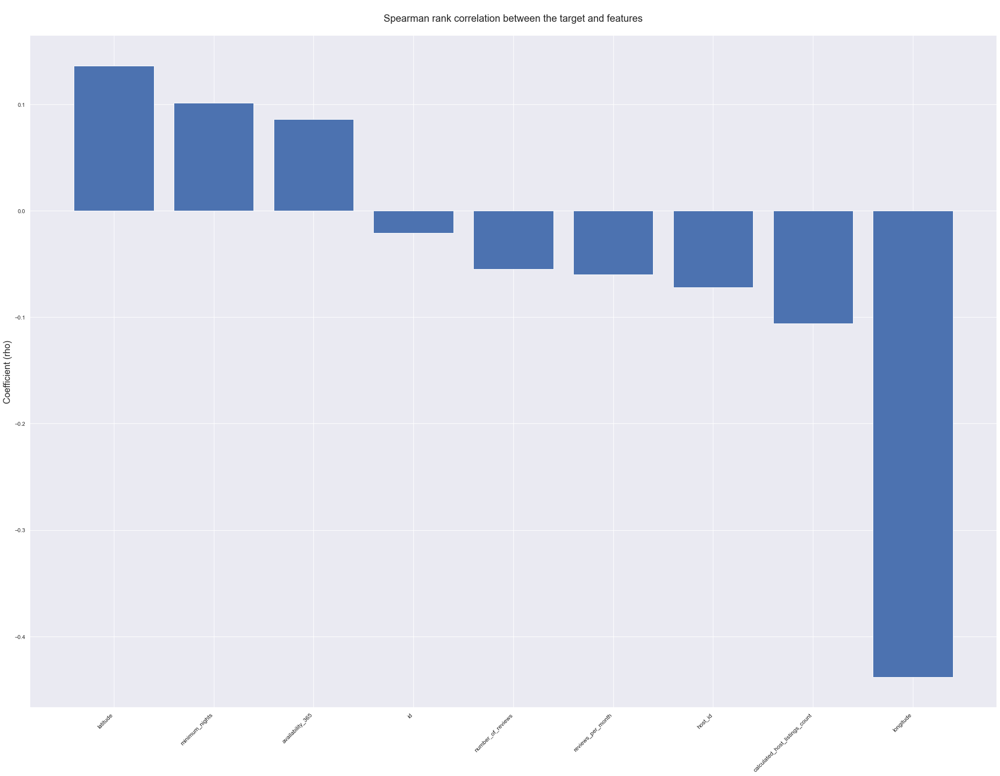

In [142]:
#Spearman Correlation 

df_corr = df1.corr(method = "spearman")
# Create DF to only include correlations with response for all features
df_corr=pd.DataFrame(df_corr)

# sort DF
df_corr.sort_values(by='price', inplace=True, ascending=False)
# Drop Response
df_corr.drop(['price'], inplace=True)

#df_corr['Response']

# Print correlations
print(df_corr['price'].round(2))

# Plot correlations
sns.set()
plt.subplots(figsize=(35,25))
plt.bar(df_corr.index, df_corr['price'])
plt.xticks(rotation=45, fontsize=12, horizontalalignment='right')
plt.ylabel('Coefficient (rho)', fontsize=18)
plt.title('\nSpearman rank correlation between the target and features\n', fontsize=20);

Observations: Bivarate correlation analysis is done above, the feature that is most positively correlated with price are latitude,mininum nights and avialibility_365. The features that are most negatively correlated are longitude,calculated_host_listings_count,host_id,reviews_per_month,number_of_reviews and id. It can be observed that price is not strongly correleated to the listed features via rho<0.5. No strong corrleation maybe there is low multicollinearity. 

In [ ]:
Multicollinearity

In variance inflation factor(VIF) analysis, each feature is regressed against all features. 
Categorical features is not included in VIF calculations. So for VIF calculations only numeric features are included. 
VIF Score:
Interpreting VIF score:
No multicollinearity: 1
Moderate multicollinearity: 5 to 10
Highly problematic multicollinearity: >10

Sources:
Minitab blog, "Enough Is Enough! Handling Multicollinearity in Regression Analysis", accessed on November 22, 2021 at https://blog.minitab.com/en/understanding-statistics/handling-multicollinearity-in-regression-analysis
Statistics How-To, "Variance Inflation Factor", accessed on November 23, 2021 at https://www.statisticshowto.com/variance-inflation-factor/
Geeks for Geeks blog, "Detecting Multicollinearity with VIF – Python", accessed on November 22, 2021 at https://www.geeksforgeeks.org/detecting-multicollinearity-with-vif-python/

In [143]:
#Multicollinearity Analysis 

from statsmodels.stats.outliers_influence import variance_inflation_factor

def vif_scores(df1):  
    # Create empty VIF dataframe
    vif = pd.DataFrame()
    # Add names of features
    vif["features"] = df1.columns
    # Add a new column and compute VIF
    vif["VIF"] = [variance_inflation_factor(df1.values, i) for i in range(len(df1.columns))] 
    # return results df
    return(vif.sort_values(by= "VIF", ascending = False)).round(2)

# Call the function to calculate VIF
vif_scores(df1[discrete_features])

,features,VIF
3,availability_365,1.45
2,number_of_reviews,1.23
1,calculated_host_listings_count,1.13
0,minimum_nights,1.12


Observations: Based on VIF calculations, no multicollinearity exists within the features as VIF=1.0

Summary for spearman correlation, Variance Inflation factor(multicollinearity analysis). Correlations were done among the numerical variables as well as multicollinearity analysis.
All of these correlation is only for numerical variable but not for categorical variables. Some more time is required to find correlations for categorical variables as well for a more wholesome analysis. 

In [144]:
 list(df1.columns.values)

['id',
 'name',
 'host_id',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'latitude',
 'longitude',
 'room_type',
 'price',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'calculated_host_listings_count',
 'availability_365']

In [146]:
df1

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,1970-01-01,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,1970-01-01,0.00,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,1970-01-01,0.00,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,1970-01-01,0.00,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,1970-01-01,0.00,6,2


In [147]:
#passing old dataframe to new dataframe
df2 = df1

In [148]:
#new dataframe for dropping the columns
df2

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,1970-01-01,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,1970-01-01,0.00,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,1970-01-01,0.00,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,1970-01-01,0.00,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,1970-01-01,0.00,6,2


In [149]:
#Dropping variable last review,host_name,name,reviews_per_month,id,host_id
df2.drop(['last_review','host_name','name','reviews_per_month','id'], axis = 1)

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
0,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,6,365
1,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2,355
2,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,1,365
3,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,1,194
4,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,1,0
...,...,...,...,...,...,...,...,...,...,...,...
48890,8232441,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,2,9
48891,6570630,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,2,36
48892,23492952,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,1,27
48893,30985759,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,6,2


In [150]:
#Dropping variable last review,host_name,name,reviews_per_month,id,host_id
df2.drop(['last_review','host_name','name','reviews_per_month','id'], axis = 1 , inplace=True)

In [151]:
df2

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
0,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,6,365
1,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2,355
2,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,1,365
3,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,1,194
4,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,1,0
...,...,...,...,...,...,...,...,...,...,...,...
48890,8232441,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,2,9
48891,6570630,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,2,36
48892,23492952,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,1,27
48893,30985759,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,6,2


In [152]:
# Converting categorical column with get.dummies - df3
df3 = pd.get_dummies(df2)

In [153]:
df3

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,neighbourhood_group_Bronx,neighbourhood_group_Brooklyn,...,neighbourhood_Williamsburg,neighbourhood_Willowbrook,neighbourhood_Windsor Terrace,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodrow,neighbourhood_Woodside,room_type_Entire home/apt,room_type_Private room,room_type_Shared room
0,2787,40.64749,-73.97237,149,1,9,6,365,0,1,...,0,0,0,0,0,0,0,0,1,0
1,2845,40.75362,-73.98377,225,1,45,2,355,0,0,...,0,0,0,0,0,0,0,1,0,0
2,4632,40.80902,-73.94190,150,3,0,1,365,0,0,...,0,0,0,0,0,0,0,0,1,0
3,4869,40.68514,-73.95976,89,1,270,1,194,0,1,...,0,0,0,0,0,0,0,1,0,0
4,7192,40.79851,-73.94399,80,10,9,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,8232441,40.67853,-73.94995,70,2,0,2,9,0,1,...,0,0,0,0,0,0,0,0,1,0
48891,6570630,40.70184,-73.93317,40,4,0,2,36,0,1,...,0,0,0,0,0,0,0,0,1,0
48892,23492952,40.81475,-73.94867,115,10,0,1,27,0,0,...,0,0,0,0,0,0,0,1,0,0
48893,30985759,40.75751,-73.99112,55,1,0,6,2,0,0,...,0,0,0,0,0,0,0,0,0,1


Create a training and test set

After feature selection is done, the dataset is split into training and test set. The target variable for our dataset is price. 


In [158]:
#Select features - df3
X=df3.drop(columns='price')

In [159]:
#Select target from df3
y = df3['price']

In [160]:
#Split before Scaling to avoid data leakage
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size= 0.3, random_state=42)

In [161]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(34226, 236)
(14669, 236)
(34226,)
(14669,)


Dimensionality reduction

Dimensionality Reduction is done on the training set. It is a way to check to see if reducing the features gives a better model performance. Model performance is checked using RandomForestRegressor after doing PCA on the training dataset.

In [239]:
#PCA Analysis using dimensionalality reduction to check if reducing dimensions helps with the values
from sklearn.ensemble import RandomForestRegressor
import time

#PCA
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
X_train2 = pca.fit_transform(X_train)
X_test2 = pca.transform(X_test)

start_time= time.time()
model0 = RandomForestRegressor()
model0.fit(X_train2, y_train)
y_pred0 = model0.predict(X_test2)

In [240]:
end_time= time.time()
time = end_time-start_time
print("time elaspsed :", time3)

time elaspsed : 5.977722644805908


In [329]:
print("predicted 1-5:",model0.predict(X_test2[0:5]))
print("actual 1-5:", y_test[0:5].tolist())
print('MAE:', metrics.mean_absolute_error(y_test, y_pred0))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred0))  
print('RMSE:',(np.sqrt(metrics.mean_squared_error(y_test, y_pred0))))
print('R-Squared:',r2_score(y_test,y_pred0))
print('EVS:', explained_variance_score(y_test,y_pred0))

predicted 1-5: [119.1225      95.10869048 159.00333333 256.83899022 190.68      ]
actual 1-5: [89, 30, 120, 470, 199]
MAE: 94.38089066069345
MSE: 54104.383669969306
RMSE: 232.60349023600077
R-Squared: -0.3396382856642488
EVS: -0.3396044867895254


Observations on PCA: PCA analysis did not give a better performaing model. Hence it will not be used further for Analysis

Scaling of the Dataset: 

In [188]:
#instantiate scaler
scaler = MinMaxScaler()

In [189]:
#Fit Scaler based on Train only
scaler.fit(X_train)

MinMaxScaler()

In [190]:
#Scale Train using Transform
X_scaled_train = scaler.transform(X_train)
print(X_scaled_train)

[[4.04115437e-01 4.65240642e-01 9.38486312e-01 ... 1.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [5.00604998e-01 3.89116074e-01 4.66590888e-01 ... 1.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [3.95911670e-01 5.86735064e-01 5.04916169e-01 ... 0.00000000e+00
  1.00000000e+00 0.00000000e+00]
 ...
 [5.04055363e-03 6.85726039e-01 5.06052856e-01 ... 1.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [6.68255146e-04 6.66126261e-01 4.94344984e-01 ... 1.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [6.26867546e-03 5.97139884e-01 5.59420290e-01 ... 1.00000000e+00
  0.00000000e+00 0.00000000e+00]]


In [191]:
#Scale Test 
X_scaled_test = scaler.transform(X_test)
print(X_scaled_test)

[[0.00593942 0.34783556 0.49838022 ... 1.         0.         0.        ]
 [0.00332278 0.50056864 0.63095576 ... 0.         1.         0.        ]
 [0.07273096 0.63244368 0.47490764 ... 0.         1.         0.        ]
 ...
 [0.01283986 0.52529823 0.56686559 ... 0.         1.         0.        ]
 [0.07335048 0.5485034  0.48697547 ... 0.         1.         0.        ]
 [0.19805463 0.41169211 0.49966847 ... 1.         0.         0.        ]]


Basic Model

Regression analysis is being done on the dataset. The purpose of regression analysis is to find a relationship between dependent and independent variable. The following regression will be looked at to find out the ones which need to be explored further.

1.Linear Regression
2.Random Forest Regressor
3.Extra Tree Regressor
4.Gradient Boosting Regressor
5.ADA Boosting Regressor
6.Decision Tree Regressor
7.KNN

All the above regressors have undergone some process. The process is outlined below.
1. Intially Baseline model is created with Linear Regression on the trained dataset. Consequently regression metrics is also checked. 
2. After Linear regression model, Random forest regressor and K nearest neighbour was considered as well. Essentially different models are tried out comparision of the metrics. Regression metrics helps us decide as to which model or models to explore further for more detailed hyperparameter tunning.
3. Feature importance is also plotted for RandomForest Regressor to see which features are important in the model.
4. Cross-Valdiation 
5. Hyperparameter tunning

Below the concepts will be explained and that is used for evaluation for our model as well. 
Metrics for Regression
The Metrics looked at are R-squared  or Adjusted R-squared, Mean square error(MAE), Root mean square error(RMSE), Mean absoulute error(MAE), Explained variance score(RSE). 
RMSE is the most important metric for evaluation for the regression model. Mean square error(MSE) or RMSE(root mean squae error), RMSE is the square root of the average squared error in the predicted y values and the actual values, the effect of each error is proportional to the size of the squared error and is sensetive to outliers. However, RMSE is the square root of MSE. RMSE is used more commonly than MSE. Mean absolute error(MAE) is another measure of error between predicted vs acutal values. Rsquared measures the variablitiy in dependent variable that can be explained by the model. R squared value is between 0 and 1 and bigger the value indicates a better fit between predicted and acutal. It does not take overfitting into consideration. Adjusted R squared penealizes additional independent variable added to the model and adjust the metric to prevent overfitting. Explained variance measure(EVC) measures the proportions for variation in a given dataset. In our analysis RMSE and R-squared value will be used to metric evaluation. Elasped Time is also calculated for the different models.

Cross Validation: K-folds cross validation method, we randomly split our data into k subsets called folds. Model is trained k times, each time picking one fold as our validation or test set and training the remaining subsets. This method reduces sampling bias and gives us an average model performance in addtion to standard deviation of model performance. Cross validation helps us asses the precision and accuracy of the model. In our model cross_val_score() is used for cross validation. 

Hyperparameter Tunning: Model such are Random forest or Decision tree is chosen as the model type for example. It is important to tune its hyperparameters. One can choose the different hyperparameter avliable in Sklearn rather than just using the default values avaliables. For our hyperparameter we can choose either Grid search or Randomized search. In our case, Grid search was chosen, it tires out possible comibnations from list of different parameters to figure out which one works the best. 


Sources: Wu, Songhao, 3 Best Metrics to Evaluate Regression Models?
https://towardsdatascience.com/what-are-the-best-metrics-to-evaluate-your-regression-model-418ca481755b
https://scikit-learn.org/stable/modules/cross_validation.html
https://scikit-learn.org/stable/modules/grid_search.html

In [192]:
# Baseline model - Linear Regression 
model=LinearRegression()

In [193]:
#Train model
model.fit(X_scaled_train,y_train)

LinearRegression()

In [194]:
#predict
y_pred = model.predict(X_scaled_test)
y_pred

array([153.6875 ,  39.6875 , 121.0625 , ..., 126.09375, 115.0625 ,
       201.03125])

In [195]:
# Import Libaries

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.metrics import explained_variance_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor


In [330]:
#Linear Regression - Metrics

print("predicted 1-5:",model.predict(X_scaled_test[0:5]))
print("actual 1-5:", y_test[0:5].tolist())
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred))  
print('RMSE:',(np.sqrt(metrics.mean_squared_error(y_test, y_pred))))
print('R-Squared:',r2_score(y_test,y_pred))
print('EVS:', explained_variance_score(y_test,y_pred))


predicted 1-5: [225.9024561   88.82045955  97.73996587 248.37350158 228.9605378 ]
actual 1-5: [89, 30, 120, 470, 199]
MAE: 996089683.1034601
MSE: 2.912849858153375e+21
RMSE: 53970824138.17094
R-Squared: -7.212290253922323e+16
EVS: -7.209833555103493e+16


In [207]:
#RandomForestRegressor
model1 = RandomForestRegressor()

In [208]:
#train model
model1.fit(X_scaled_train,y_train)

RandomForestRegressor()

In [209]:
#predict
y_pred1 = model1.predict(X_scaled_test)
y_pred1

array([151.82,  48.44,  97.2 , ...,  89.93, 108.58, 200.74])

In [331]:
print("predicted 1-5:",model1.predict(X_scaled_test[0:5]))
print("actual 1-5:", y_test[0:5].tolist())
print('MAE:', metrics.mean_absolute_error(y_test, y_pred1))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred1))  
print('RMSE:',(np.sqrt(metrics.mean_squared_error(y_test, y_pred1))))
print('R-Squared:',r2_score(y_test,y_pred1))
print('EVS:', explained_variance_score(y_test,y_pred1))

predicted 1-5: [151.82  48.44  97.2  305.06 148.71]
actual 1-5: [89, 30, 120, 470, 199]
MAE: 63.31694594041857
MSE: 34600.82059562494
RMSE: 186.01295813900958
R-Squared: 0.14327489121685955
EVS: 0.14439367547267035


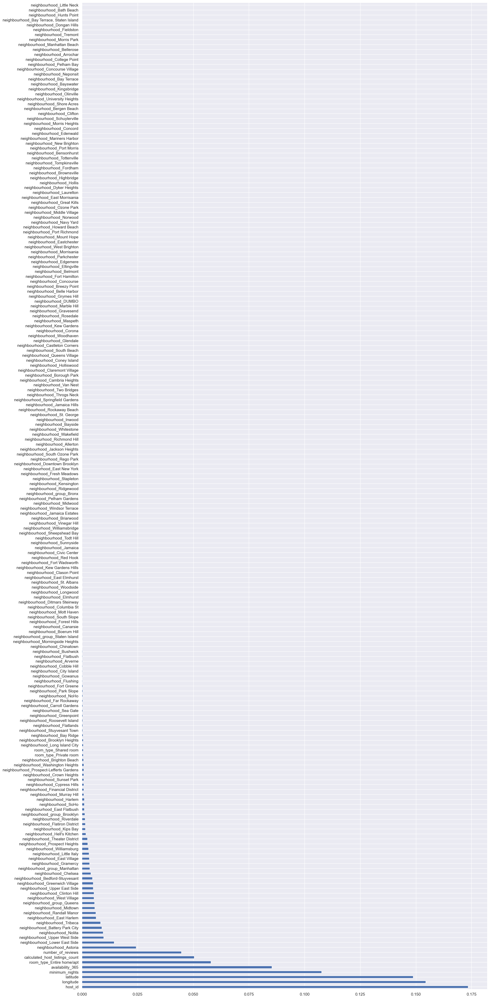

In [205]:
plt.figure(dpi=100, figsize=(20,50))
pd.Series(model1.feature_importances_, index=X.columns).sort_values().nlargest(200).plot(kind='barh');

In [211]:
#Feature Importance for model1
feature_importance=pd.DataFrame({'X':list(X.columns),'feature_importance':[i for i in model1.feature_importances_]})
feature_importance.sort_values('feature_importance',ascending=False)

,X,feature_importance
0,host_id,1.769975e-01
2,longitude,1.501975e-01
1,latitude,1.433439e-01
3,minimum_nights,1.062816e-01
6,availability_365,8.880380e-02
233,room_type_Entire home/apt,5.944777e-02
5,calculated_host_listings_count,5.596719e-02
4,number_of_reviews,4.898915e-02
16,neighbourhood_Astoria,2.032725e-02
214,neighbourhood_Upper West Side,1.216567e-02


In [309]:
#DecisionTreeRegressor

from sklearn.tree import DecisionTreeRegressor
model10 = DecisionTreeRegressor()

In [310]:
#train model
model10.fit(X_scaled_train,y_train)

DecisionTreeRegressor()

In [311]:
#predict
y_pred10 = model1.predict(X_scaled_test)
y_pred10

array([151.82,  48.44,  97.2 , ...,  89.93, 108.58, 200.74])

In [332]:
#Metrics for Decision TreeRegressor

print("predicted 1-5:",model1.predict(X_scaled_test[0:5]))
print("actual 1-5:", y_test[0:5].tolist())
print('MAE:', metrics.mean_absolute_error(y_test, y_pred10))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred10))  
print('RMSE:',(np.sqrt(metrics.mean_squared_error(y_test, y_pred1))))
print('R-Squared:',r2_score(y_test,y_pred10))
print('EVS:', explained_variance_score(y_test,y_pred10))

predicted 1-5: [151.82  48.44  97.2  305.06 148.71]
actual 1-5: [89, 30, 120, 470, 199]
MAE: 63.31694594041857
MSE: 34600.82059562494
RMSE: 186.01295813900958
R-Squared: 0.14327489121685955
EVS: 0.14439367547267035


In [313]:
from sklearn.neighbors import KNeighborsRegressor
model11 = KNeighborsRegressor()

In [315]:
#train model
model11.fit(X_scaled_train,y_train)

KNeighborsRegressor()

In [316]:
#predict
y_pred11 = model11.predict(X_scaled_test)
y_pred11

array([102.8,  58.8,  88.4, ...,  91.2,  92. , 211.8])

In [333]:
print("predicted 1-5:",model11.predict(X_scaled_test[0:5]))
print("actual 1-5:", y_test[0:5].tolist())
print('MAE:', metrics.mean_absolute_error(y_test, y_pred11))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred11))  
print('RMSE:',(np.sqrt(metrics.mean_squared_error(y_test, y_pred11))))
print('R-Squared:',r2_score(y_test,y_pred11))
print('EVS:', explained_variance_score(y_test,y_pred11))

predicted 1-5: [102.8  58.8  88.4 314.2 141.2]
actual 1-5: [89, 30, 120, 470, 199]
MAE: 70.06266275819756
MSE: 40011.51577885337
RMSE: 200.028787375351
R-Squared: 0.009304703815294801
EVS: 0.009568593241445322


Training and Evaluation:

Steps done in this section are Cross Validation, Hyperparameter Tuning,GridSearchCV, Final Model Testing and finally Prediction for the metrics.

Random Forest Regressor Cross Validation and Hyperparameter Tuning

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [234]:
#Cross Validation

model2 = RandomForestRegressor(n_estimators=100)
cv_scores2 = cross_val_score(model2,X_scaled_train,y_train,cv=5,scoring='neg_mean_squared_error')
print("Scores:",np.sqrt(-cv_scores2))
print("Mean:",np.sqrt(-cv_scores2).mean())
print('Standard deviation:', np.sqrt(-cv_scores2).std())


Scores: [185.02442534 249.84757385 237.47261421 247.90680082 299.49018182]
Mean: 243.94831920976307
Standard deviation: 36.46732594576616


In [220]:
#RandomForestRegressor Hyperparameter Tuning

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import  numpy as np
import time 

# Define hyperparameters search space and distributions to sample from
param_grid = [{
    'n_estimators' : [100,200,300],
    'max_depth' : [2,4,19],
    'min_samples_leaf':[1,6],
    'max_features':[1,2]
}]

start_time2= time.time()
model2 = RandomForestRegressor()


# Explore the hyperparameters search space
grid_search_rfr = GridSearchCV(estimator=model2,
                      param_grid = param_grid,
                      cv=5,n_jobs=-1,verbose=3)

# Fit search on the training data to create the model 
grid_search_rfr.fit(X_scaled_train,y_train)

end_time2 = time.time()
time2 = end_time2-start_time2
print(f"Elapsed time: {time2:.3f} seconds")


Fitting 5 folds for each of 36 candidates, totalling 180 fits
Elapsed time: 125.053 seconds


In [221]:
#Random forest regressor Best parameter,estimator and score
print(grid_search_rfr.best_params_)
print("\n",grid_search_rfr.best_estimator_)
print (grid_search_rfr.best_score_)

{'max_depth': 19, 'max_features': 2, 'min_samples_leaf': 1, 'n_estimators': 200}

 RandomForestRegressor(max_depth=19, max_features=2, n_estimators=200)
0.09044332567023669


In [284]:
# Random Forest final model
final_model2 = grid_search_rfr.best_estimator_
print(grid_search_rfr, X_scaled_test, y_test)

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid=[{'max_depth': [2, 4, 19], 'max_features': [1, 2],
                          'min_samples_leaf': [1, 6],
                          'n_estimators': [100, 200, 300]}],
             verbose=3) [[0.00593942 0.34783556 0.49838022 ... 1.         0.         0.        ]
 [0.00332278 0.50056864 0.63095576 ... 0.         1.         0.        ]
 [0.07273096 0.63244368 0.47490764 ... 0.         1.         0.        ]
 ...
 [0.01283986 0.52529823 0.56686559 ... 0.         1.         0.        ]
 [0.07335048 0.5485034  0.48697547 ... 0.         1.         0.        ]
 [0.19805463 0.41169211 0.49966847 ... 1.         0.         0.        ]] 879       89
44383     30
15394    120
43230    470
16332    199
        ... 
9370      65
34442     55
9164      90
11841     95
46958     97
Name: price, Length: 14669, dtype: int64


In [286]:
print ( grid_search_rfr.best_params_)
print("\n",grid_search_rfr.best_estimator_)
final_model2 = grid_search_rfr.best_estimator_
y_pred2=final_model2.predict(X_scaled_test)
print(final_model2, X_scaled_test, y_test)

{'max_depth': 19, 'max_features': 2, 'min_samples_leaf': 1, 'n_estimators': 200}

 RandomForestRegressor(max_depth=19, max_features=2, n_estimators=200)
RandomForestRegressor(max_depth=19, max_features=2, n_estimators=200) [[0.00593942 0.34783556 0.49838022 ... 1.         0.         0.        ]
 [0.00332278 0.50056864 0.63095576 ... 0.         1.         0.        ]
 [0.07273096 0.63244368 0.47490764 ... 0.         1.         0.        ]
 ...
 [0.01283986 0.52529823 0.56686559 ... 0.         1.         0.        ]
 [0.07335048 0.5485034  0.48697547 ... 0.         1.         0.        ]
 [0.19805463 0.41169211 0.49966847 ... 1.         0.         0.        ]] 879       89
44383     30
15394    120
43230    470
16332    199
        ... 
9370      65
34442     55
9164      90
11841     95
46958     97
Name: price, Length: 14669, dtype: int64


In [334]:
#Results for Random Forest Regressor
from sklearn import metrics
print("predicted 1-5:",final_model2.predict(X_scaled_test[0:5]))
print("actual 1-5:", y_test[0:5].tolist())
print('MAE:', metrics.mean_absolute_error(y_test, y_pred1))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred1))  
print('RMSE:',(np.sqrt(metrics.mean_squared_error(y_test, y_pred1))))
print('R-Squared:',r2_score(y_test,y_pred1))
print('EVS:', explained_variance_score(y_test,y_pred1))

predicted 1-5: [154.74738013 115.88581965 144.88861394 224.19755102 168.76981625]
actual 1-5: [89, 30, 120, 470, 199]
MAE: 63.31694594041857
MSE: 34600.82059562494
RMSE: 186.01295813900958
R-Squared: 0.14327489121685955
EVS: 0.14439367547267035


In [298]:
#Cross Validation Score on the final model - Random Forest Regressor
cv_scores2 = cross_val_score(final_model2,X_scaled_train,y_train,cv=5,scoring='neg_mean_squared_error')
print("Scores:",np.sqrt(-cv_scores2))
print("Mean:",np.sqrt(-cv_scores2).mean())
print('Standard deviation:', np.sqrt(-cv_scores2).std())


Scores: [197.75346677 256.37639944 229.42184523 231.35216402 293.96191778]
Mean: 241.7731586474876
Standard deviation: 32.049357454518784


ExtraTree Regressor CrossValidation and Hyperparameter Tuning

In [299]:
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor,ExtraTreesRegressor
#CrossValidation Score for Extra Tree Regressor

model3 = ExtraTreesRegressor()
cv_scores3 = cross_val_score(model3,X_scaled_train,y_train,cv=2,scoring='neg_mean_squared_error')
print("Scores:", np.sqrt(-cv_scores3))  
print("Mean:", np.sqrt(-cv_scores3).mean()) 
print('Standard deviation:', np.sqrt(-cv_scores3).std()) 

Scores: [235.34639463 270.15627964]
Mean: 252.75133713397162
Standard deviation: 17.404942501495896


In [335]:
#ExtraTreeRegressor Hyperparameter Tuning
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import ExtraTreesRegressor
import  numpy as np
import time

# Define hyperparameters search space and distributions to sample from
param_grid = [{
    'n_estimators' : [50,75,150],
    'min_samples_leaf' : [5,10],
}]

start_time3= time.time()
# Explore the hyperparameters search space
model3 = ExtraTreesRegressor()


grid_search_etr = GridSearchCV(estimator=model3,
                      param_grid = param_grid,
                      cv=5,n_jobs=-1,verbose=3)

# Fit search on the training data to create the model 
grid_search_etr.fit(X_train,y_train)

end_time3 = time.time()
time3 = end_time3-start_time3
print(f"Elapsed time: {time2:.3f} seconds")


Fitting 5 folds for each of 6 candidates, totalling 30 fits
Elapsed time: 125.053 seconds


In [336]:
#ExtraTrees Best parameter,estimator and score
print(grid_search_etr.best_params_)
print("\n",grid_search_etr.best_estimator_)
print (grid_search_etr.best_score_)

{'min_samples_leaf': 10, 'n_estimators': 150}

 ExtraTreesRegressor(min_samples_leaf=10, n_estimators=150)
0.1359996546049217


In [337]:
#Extra trees final model
final_model3 = grid_search_etr.best_estimator_
print(grid_search_etr, X_scaled_test, y_test)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(), n_jobs=-1,
             param_grid=[{'min_samples_leaf': [5, 10],
                          'n_estimators': [50, 75, 150]}],
             verbose=3) [[0.00593942 0.34783556 0.49838022 ... 1.         0.         0.        ]
 [0.00332278 0.50056864 0.63095576 ... 0.         1.         0.        ]
 [0.07273096 0.63244368 0.47490764 ... 0.         1.         0.        ]
 ...
 [0.01283986 0.52529823 0.56686559 ... 0.         1.         0.        ]
 [0.07335048 0.5485034  0.48697547 ... 0.         1.         0.        ]
 [0.19805463 0.41169211 0.49966847 ... 1.         0.         0.        ]] 879       89
44383     30
15394    120
43230    470
16332    199
        ... 
9370      65
34442     55
9164      90
11841     95
46958     97
Name: price, Length: 14669, dtype: int64


In [338]:
#Extra Tree - Metrics for Final Model
from sklearn import metrics

final_model3 = grid_search_etr.best_estimator_
y_pred3=final_model3.predict(X_scaled_test)


print("predicted 1-5:",final_model3.predict(X_scaled_test[0:5]))
print("actual 1-5:", y_test[0:5].tolist())
print('MAE:', metrics.mean_absolute_error(y_test, y_pred3))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred3))  
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred3)))
print('R-Squared:',r2_score(y_test,y_pred3))
print('EVS:', explained_variance_score(y_test,y_pred3))


C:\Users\ocean\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


predicted 1-5: [135.61872781  82.42966049 110.6159446  254.99349313 387.68314569]
actual 1-5: [89, 30, 120, 470, 199]
MAE: 70.4138163738892
MSE: 36345.44676361961
RMSE: 190.64481834977738
R-Squared: 0.10007750404997406
EVS: 0.10008427724617353


C:\Users\ocean\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


In [339]:
#Cross Validation for Extratree Regressor
cv_scores3 = cross_val_score(final_model3,X_scaled_train,y_train,cv=2,scoring='neg_mean_squared_error')
print("Scores:",np.sqrt(-cv_scores3))
print("Mean:",np.sqrt(-cv_scores3).mean())
print('Standard deviation:', np.sqrt(-cv_scores3).std())

Scores: [213.79084435 264.19034794]
Mean: 238.99059614563282
Standard deviation: 25.19975179342312


Gradient Boosting Regressor Cross validation and Hyperparameter Tuning

In [340]:
# CrossValidation Gradient Boosting 
model4 = GradientBoostingRegressor()
cv_scores4 = cross_val_score(model4,X_train,y_train,cv=2,scoring='neg_mean_squared_error')
print("Scores:", np.sqrt(-cv_scores4))  
print("Mean:", np.sqrt(-cv_scores4).mean()) 
print('Standard deviation:', np.sqrt(-cv_scores4).std()) 

Scores: [212.82361488 262.73386178]
Mean: 237.77873833174954
Standard deviation: 24.955123450928


In [341]:
#Gradient Boosting Hyperparameter Tuning
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
import  numpy as np
import time

start_time4= time.time()

#Fit the model
model4 = GradientBoostingRegressor()
# Define hyperparameters search space and distributions to sample from
param_grid = [{
    'n_estimators' : [50,75,150],
    'max_depth' : [5,10],
}]
start_time4= time.time()


# Explore the hyperparameters search space
grid_search_gb = GridSearchCV(estimator=model4,
                      param_grid = param_grid,
                      cv=5,n_jobs=-1,verbose=3)


# Fit search on the training data to create the model 
grid_search_gb.fit(X_train,y_train)

end_time4 = time.time()
time4 = end_time4-start_time4
print(f"Elapsed time: {time2:.3f} seconds")

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Elapsed time: 125.053 seconds


In [342]:
#Gradient Boosting Best Parameter,Estimator and score
print(grid_search_gb.best_params_)
print("\n",grid_search_gb.best_estimator_)
print (grid_search_gb.best_score_)

{'max_depth': 5, 'n_estimators': 75}

 GradientBoostingRegressor(max_depth=5, n_estimators=75)
0.11062095594806913


In [343]:
#Gradient boosting - final model
final_model4 = grid_search_gb.best_estimator_
print(grid_search_gb, X_scaled_test, y_test)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid=[{'max_depth': [5, 10], 'n_estimators': [50, 75, 150]}],
             verbose=3) [[0.00593942 0.34783556 0.49838022 ... 1.         0.         0.        ]
 [0.00332278 0.50056864 0.63095576 ... 0.         1.         0.        ]
 [0.07273096 0.63244368 0.47490764 ... 0.         1.         0.        ]
 ...
 [0.01283986 0.52529823 0.56686559 ... 0.         1.         0.        ]
 [0.07335048 0.5485034  0.48697547 ... 0.         1.         0.        ]
 [0.19805463 0.41169211 0.49966847 ... 1.         0.         0.        ]] 879       89
44383     30
15394    120
43230    470
16332    199
        ... 
9370      65
34442     55
9164      90
11841     95
46958     97
Name: price, Length: 14669, dtype: int64


In [344]:
#Gradient boosting - final model
final_model4 = grid_search_gb.best_estimator_
print(grid_search_gb, X_scaled_test, y_test)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid=[{'max_depth': [5, 10], 'n_estimators': [50, 75, 150]}],
             verbose=3) [[0.00593942 0.34783556 0.49838022 ... 1.         0.         0.        ]
 [0.00332278 0.50056864 0.63095576 ... 0.         1.         0.        ]
 [0.07273096 0.63244368 0.47490764 ... 0.         1.         0.        ]
 ...
 [0.01283986 0.52529823 0.56686559 ... 0.         1.         0.        ]
 [0.07335048 0.5485034  0.48697547 ... 0.         1.         0.        ]
 [0.19805463 0.41169211 0.49966847 ... 1.         0.         0.        ]] 879       89
44383     30
15394    120
43230    470
16332    199
        ... 
9370      65
34442     55
9164      90
11841     95
46958     97
Name: price, Length: 14669, dtype: int64


In [345]:
#Gradient Boosting -  Metrics
from sklearn import metrics

final_model4 = grid_search_gb.best_estimator_
y_pred4=final_model4.predict(X_scaled_test)

print("predicted 1-5:",final_model4.predict(X_scaled_test[0:5]))
print("actual 1-5:", y_test[0:5].tolist())
print('MAE:', metrics.mean_absolute_error(y_test, y_pred4))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred4))  
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred4)))
print('R-Squared:',r2_score(y_test,y_pred4))
print('EVS:', explained_variance_score(y_test,y_pred4))

predicted 1-5: [509.20444594 401.12995289 420.55501192 549.07474852 942.59572298]
actual 1-5: [89, 30, 120, 470, 199]
MAE: 381.6631044565128
MSE: 193534.59776823787
RMSE: 439.92567300424497
R-Squared: -3.7919658109859995
EVS: -0.5477656921069798


C:\Users\ocean\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(
C:\Users\ocean\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


In [347]:
# CrossValidation Gradient Boosting 
cv_scores4 = cross_val_score(final_model4,X_train,y_train,cv=2,scoring='neg_mean_squared_error')
print("Scores:", np.sqrt(-cv_scores4))  
print("Mean:", np.sqrt(-cv_scores4).mean()) 
print('Standard deviation:', np.sqrt(-cv_scores4).std()) 

Scores: [214.53859201 265.4063635 ]
Mean: 239.97247775348293
Standard deviation: 25.433885742726915


Ada boost Regressor CrossValidation and Hyperparameter tuning

In [348]:
# CrossValidation for ada boost Regressor

model5 = AdaBoostRegressor()
scores12 = cross_val_score(model5,X_train,np.ravel(y_train),cv=2,scoring='neg_mean_squared_error')
print("Scores:", np.sqrt(-scores12))  
print("Mean:", np.sqrt(-scores12).mean()) 
print('Standard deviation:', np.sqrt(-scores12).std()) 

Scores: [542.63880677 412.30291694]
Mean: 477.4708618542759
Standard deviation: 65.16794491251059


In [349]:
#AdaBoost Regressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import GridSearchCV
import time


# Determine model
model5 = AdaBoostRegressor()

start_time5= time.time()

# Define hyperparameters search space and distributions to sample from
param_grid = {
    'n_estimators': [100,116,150],
    'learning_rate': [0.01,1],
    }

# Explore the hyperparameters search space
grid_search_ada = GridSearchCV(estimator = model5, 
                               param_grid=param_grid, scoring='neg_root_mean_squared_error', 
                               cv=3, verbose=3, n_jobs=-1)

# Fit search on the training data to create the model 
ada = grid_search_ada.fit(X_scaled_train, y_train)


end_time5 = time.time()
time5 = end_time5-start_time5
print(f"Elapsed time: {time2:.3f} seconds")

Fitting 3 folds for each of 6 candidates, totalling 18 fits
Elapsed time: 125.053 seconds


In [350]:
#Ada Boosting Best Parameter,Estimator and score
print(grid_search_ada.best_params_)
print("\n",grid_search_ada.best_estimator_)
print (grid_search_ada.best_score_)

{'learning_rate': 0.01, 'n_estimators': 116}

 AdaBoostRegressor(learning_rate=0.01, n_estimators=116)
-244.09680156262266


In [351]:
#Ada boosting - final model
final_model5 = grid_search_ada.best_estimator_
print(grid_search_ada, X_scaled_test, y_test)

GridSearchCV(cv=3, estimator=AdaBoostRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 1],
                         'n_estimators': [100, 116, 150]},
             scoring='neg_root_mean_squared_error', verbose=3) [[0.00593942 0.34783556 0.49838022 ... 1.         0.         0.        ]
 [0.00332278 0.50056864 0.63095576 ... 0.         1.         0.        ]
 [0.07273096 0.63244368 0.47490764 ... 0.         1.         0.        ]
 ...
 [0.01283986 0.52529823 0.56686559 ... 0.         1.         0.        ]
 [0.07335048 0.5485034  0.48697547 ... 0.         1.         0.        ]
 [0.19805463 0.41169211 0.49966847 ... 1.         0.         0.        ]] 879       89
44383     30
15394    120
43230    470
16332    199
        ... 
9370      65
34442     55
9164      90
11841     95
46958     97
Name: price, Length: 14669, dtype: int64


In [352]:
#Ada boosting -  Metrics
from sklearn import metrics

final_model5 = grid_search_ada.best_estimator_
y_pred5=final_model5.predict(X_scaled_test)

print("predicted 1-5:",final_model5.predict(X_scaled_test[0:5]))
print("actual 1-5:", y_test[0:5].to_list())
print('MAE:', metrics.mean_absolute_error(y_test, y_pred5))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred5))  
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred5)))
print('R-Squared:',r2_score(y_test,y_pred5))
print('EVS:', explained_variance_score(y_test,y_pred5))

predicted 1-5: [222.6805389   90.00086564 103.19702649 242.98301053 215.32808732]
actual 1-5: [89, 30, 120, 470, 199]
MAE: 77.52167889235126
MSE: 35698.880169989425
RMSE: 188.94147286921796
R-Squared: 0.11608665717778788
EVS: 0.12476052200344367


In [353]:
# CrossValidation Ada Boosting on final model with best estimators
cv_scores4 = cross_val_score(final_model5,X_train,y_train,cv=2,scoring='neg_mean_squared_error')
print("Scores:", np.sqrt(-cv_scores4))  
print("Mean:", np.sqrt(-cv_scores4).mean()) 
print('Standard deviation:', np.sqrt(-cv_scores4).std()) 

Scores: [218.41190684 268.98792676]
Mean: 243.69991679877126
Standard deviation: 25.28800995913231


Decision Tree Regressor CrossValidation and Hyperparameter Tuning

In [355]:
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor,ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor

#CrossValidation Score for Decision Tree Regressor
model6 = DecisionTreeRegressor()
cv_scores6 = cross_val_score(model6,X_scaled_train,y_train,cv=2,scoring='neg_mean_squared_error')
print("Scores:", np.sqrt(-cv_scores6))  
print("Mean:", np.sqrt(-cv_scores6).mean()) 
print('Standard deviation:', np.sqrt(-cv_scores3).std()) 

Scores: [318.42952192 313.57882099]
Mean: 316.0041714508768
Standard deviation: 25.19975179342312


In [357]:
#DecisionTreeRegressor Hyperparameter Tuning
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
import  numpy as np
import time

# Define hyperparameters search space and distributions to sample from
param_grid = [{
    'max_depth' : [2,10],
    'min_samples_leaf' : [5,10],
}]

start_time6= time.time()
# Explore the hyperparameters search space
model6 = DecisionTreeRegressor()


grid_search_dtr = GridSearchCV(estimator=model3,
                      param_grid = param_grid,
                      cv=5,n_jobs=-1,verbose=3)

# Fit search on the training data to create the model 
grid_search_dtr.fit(X_train,y_train)

end_time6 = time.time()
time6 = end_time6-start_time6
print(f"Elapsed time: {time6:.3f} seconds")


Fitting 5 folds for each of 4 candidates, totalling 20 fits
Elapsed time: 110.043 seconds


In [375]:
#DecisionTree Best parameter,estimator and score
print(grid_search_dtr.best_params_)
print("\n",grid_search_dtr.best_estimator_)
print (grid_search_dtr.best_score_)

{'max_depth': 10, 'min_samples_leaf': 10}

 ExtraTreesRegressor(max_depth=10, min_samples_leaf=10)
0.12137026561689772


In [359]:
#Decision trees final model
final_model6 = grid_search_dtr.best_estimator_
print(grid_search_dtr, X_scaled_test, y_test)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(), n_jobs=-1,
             param_grid=[{'max_depth': [2, 10], 'min_samples_leaf': [5, 10]}],
             verbose=3) [[0.00593942 0.34783556 0.49838022 ... 1.         0.         0.        ]
 [0.00332278 0.50056864 0.63095576 ... 0.         1.         0.        ]
 [0.07273096 0.63244368 0.47490764 ... 0.         1.         0.        ]
 ...
 [0.01283986 0.52529823 0.56686559 ... 0.         1.         0.        ]
 [0.07335048 0.5485034  0.48697547 ... 0.         1.         0.        ]
 [0.19805463 0.41169211 0.49966847 ... 1.         0.         0.        ]] 879       89
44383     30
15394    120
43230    470
16332    199
        ... 
9370      65
34442     55
9164      90
11841     95
46958     97
Name: price, Length: 14669, dtype: int64


In [360]:
#Decision Tree  - Metrics for Final Model
from sklearn import metrics

final_model6 = grid_search_dtr.best_estimator_
y_pred6=final_model6.predict(X_scaled_test)


print("predicted 1-5:",final_model6.predict(X_scaled_test[0:5]))
print("actual 1-5:", y_test[0:5].tolist())
print('MAE:', metrics.mean_absolute_error(y_test, y_pred6))  
print('MSE:', metrics.mean_squared_error(y_test, y_pred6))  
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred6)))
print('R-Squared:',r2_score(y_test,y_pred6))
print('EVS:', explained_variance_score(y_test,y_pred6))

predicted 1-5: [139.15623151  70.89362415 104.15878852 217.9213291  268.74810658]
actual 1-5: [89, 30, 120, 470, 199]
MAE: 64.41156940878484
MSE: 36027.99386522344
RMSE: 189.8104155867729
R-Squared: 0.10793771846773192
EVS: 0.11290467454642905


C:\Users\ocean\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(
C:\Users\ocean\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but ExtraTreesRegressor was fitted with feature names
  warnings.warn(


In [361]:
#Cross Validation for Decision Tree Regressor
cv_scores6 = cross_val_score(final_model6,X_scaled_train,y_train,cv=2,scoring='neg_mean_squared_error')
print("Scores:",np.sqrt(-cv_scores6))
print("Mean:",np.sqrt(-cv_scores6).mean())
print('Standard deviation:', np.sqrt(-cv_scores6).std())

Scores: [214.99766521 264.98743256]
Mean: 239.99254888504066
Standard deviation: 24.994883673110337


Predictions: 

Analyzing the Results: Intially the excercise was build with Baseline Model using no settings at all. The models that were looked at were 1. Linear Regression 2.Random Forest Regressor 3. Decision Tree Regressor 4. K Nearest Neighbours. From initial running of the models. The resutls for RMSE/R-square/MAE/MSE were 
1. Linear Regression: RMSE: 53970, R-square:-7.21, MAE:996089683, MSE:2.9121 
2. Random Forest Regressor: RMSE:186 , R-square:0.143,MAE:63.31, MSE:34600
3. Decision Tree Regressor: RMSE:186, R-square:0.143,MAE:63.31, MSE:34600
4. K Nearest Neighbour: RMSE:200, R-square:0.009,MAE:70, MSE:40011
Based on the numbers Linear Regression does not work out at all as the RMSE value is very big and R-squared value is negative indicating a poor fit to the model. The best performing model is Random Forest Regressor and Decision Tree Regressor with RMSE: 186 and R-squared: 0.143. KNN does not perform as well. 

Next step was performing Hyperparameter tuning. The models considered were: 
1. Random Forest Regressor: RMSE:186, R-square:0.143, MAE:63.31, MSE:34600, Elasped Time:125 secs
2. Extra Tree Regressor: RMSE:190, R-square:0.143, MAE:63.31, MSE:34600, Elasped Time:110 secs
3. Gradient Boosting Regressor: RMSE:439, R-square:-3.79, MAE:381, MSE:193534, Elasped Time:125 secs
4. Ada Boosting Regressor:RMSE:188, R-square:0.116, MAE:72.52, MSE:193534, Elasped Time:125 secs
5. Decision Tree Regressor:RMSE:189, R-square:0.108, MAE:72.52, MSE:35698, Elasped Time:110 secs

Based on the Lowest RMSE and R-squared value Random Forest Regressor comes on the top. It can be observed that even after hyperparameter tuning the metrics for random forest regressor stays the same. Based on the R-squared value we can intrepret that the model is 14% of the dependent variablity is explained by the model. 
Maybe a more robust hyperparameter tuning is requried to further improve the model. Hence the model can be used for predicting the price.